<a href="https://colab.research.google.com/github/Fall-Llihc/Kode_TimGacor/blob/main/Datathon_forecasting_modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center>**Smart Portfolio Rebalancing: AI-Driven Volatility Forecast and Investment Optimization during Global Conflicts**</center>


In [ ]:
!pip install neuralforecast

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.0/261.0 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.8/285.8 kB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.9/68.9 MB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 120.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# download data volatilitas sektor + geopolitic 2
!gdown 1P2LXh8gwsfggiA1TTzGU9mdYYhV3hEMB

Downloading...
From: https://drive.google.com/uc?id=1P2LXh8gwsfggiA1TTzGU9mdYYhV3hEMB
To: /content/sector_vol_with_geo_2_7d.csv
100% 3.24M/3.24M [00:00<00:00, 27.1MB/s]


# ***Modeling***
---

## ***Baseline***

### **1. LSTM**

In [ ]:
import pandas as pd

# ======================= LOAD DATA =======================
df = pd.read_csv("/content/sector_vol_with_geo_2_7d.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(['Sector', 'Date'])
df.head()

,Date,Sector,SectorVolatility_7d,SectorReturn_avg,ArticlesCount_Daily,GPR_Daily,GPR_Action_Daily,GPR_Threat_Daily
0,2015-01-13,Basic Materials,0.016909,-0.001049,765,151.555389,259.009521,79.214493
1,2015-01-14,Basic Materials,0.019377,-0.018419,787,88.391258,151.061447,77.000107
2,2015-01-15,Basic Materials,0.018848,0.000000,923,132.789825,257.606415,23.874355
3,2015-01-16,Basic Materials,0.019909,0.004587,870,156.109512,258.116364,82.318504
4,2015-01-19,Basic Materials,0.014540,-0.004497,606,120.258240,130.786987,109.089256


In [ ]:
# Import library
import pandas as pd
import numpy as np
from neuralforecast import NeuralForecast
from neuralforecast.models import LSTM
from neuralforecast.losses.pytorch import MSE
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# ======================= KONFIGURASI =======================
LOOKBACK = 30
FORECAST_HORIZON = 7
MAX_STEPS = 500
BATCH_SIZE = 16
N_SPLITS = 2
NEWS_WINDOW = 7

# 📘 DEFINISIKAN SKENARIO FITUR
scenarios = {
    "Univariate (Tanpa Berita)": [],
    "Multivariate (Article Count)": ['ArticlesCount_Daily'],
    "Multivariate (GPR_Daily)": ['GPR_Daily'],
    "Multivariate (GPR_Action_Daily)": ['GPR_Action_Daily'],
    "Multivariate (GPR_Threat_Daily)": ['GPR_Threat_Daily']
}

target_column = 'SectorVolatility_7d'
sectors = df['Sector'].unique()
results = []

# Fungsi sMAPE
def smape(y_true, y_pred):
    epsilon = 1e-8
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) + epsilon
    return np.mean(2.0 * numerator / denominator) * 100

# ======================= LOOPING EKSPERIMEN =======================
for scenario_name, news_features in scenarios.items():
    print(f"\n==================== MENJALANKAN SKENARIO: {scenario_name} ====================")

    for sector in sectors:
        print(f"\nTraining Model untuk Sektor: {sector} | Fitur: {1 + len(news_features)} ({[target_column] + news_features})")

        df_sector = df[df['Sector'] == sector].copy()

        if news_features:
            for col in news_features:
                df_sector[col] = df_sector[col].rolling(window=NEWS_WINDOW, min_periods=1).sum()

        df_nf = df_sector.rename(columns={
            'Date': 'ds',
            target_column: 'y',
            'Sector': 'unique_id'
        })

        all_cols = ['ds', 'unique_id', 'y'] + news_features
        df_nf = df_nf[all_cols]

        min_data_len = FORECAST_HORIZON + (N_SPLITS * FORECAST_HORIZON) + LOOKBACK
        if len(df_nf) < min_data_len:
            print(f"Skipping sector {sector} karena data tidak cukup.")
            continue

        # 3. ⚙️ DEFINISI MODEL LSTM
        models = [
            LSTM(
                h=FORECAST_HORIZON,
                input_size=LOOKBACK,
                hist_exog_list=news_features if news_features else None,
                scaler_type='minmax',
                loss=MSE(),
                max_steps=MAX_STEPS,
                random_seed=1,
                batch_size=BATCH_SIZE
            )
        ]
        nf = NeuralForecast(models=models, freq='D')

        # 4. 🚀 CROSS-VALIDATION
        cv_df = nf.cross_validation(df=df_nf, n_windows=N_SPLITS, step_size=FORECAST_HORIZON)

        if cv_df.empty:
            print(f"  ⚠️ Skipping evaluasi untuk {sector} karena output kosong.")
            continue

        model_name = 'LSTM'

        if model_name not in cv_df.columns or 'y' not in cv_df.columns:
            print(f"  ⚠️ Kolom {model_name} atau 'y' tidak tersedia.")
            continue

        temp_df = cv_df.dropna(subset=[model_name, 'y'])
        if temp_df.empty:
            print(f"  ⚠️ Tidak ada hasil valid untuk {sector}.")
            continue

        mae = mean_absolute_error(temp_df['y'], temp_df[model_name])
        rmse = np.sqrt(mean_squared_error(temp_df['y'], temp_df[model_name]))
        smape_val = smape(temp_df['y'], temp_df[model_name])

        results.append({
            'Skenario': f"{scenario_name} - {model_name}",
            'Sektor': sector,
            'Jml_Fitur': 1 + len(news_features),
            'MAE': mae,
            'RMSE': rmse,
            'SMAPE': smape_val
        })
        print(f"  ✅ Selesai: {sector} | MAE={mae:.4f}, RMSE={rmse:.4f}, SMAPE={smape_val:.4f}")

# ======================= HASIL AKHIR =======================
print("\n\n======================= HASIL AKHIR PERBANDINGAN MODEL =======================")
results_df = pd.DataFrame(results)
print(results_df.to_string())

In [ ]:
# @title Pivot Results

value = 'SMAPE' #@param ['MAE', 'RMSE', 'SMAPE']

if not results_df.empty:
    rmse_pivot = results_df.pivot_table(index='Sektor', columns='Skenario', values=value)

    print(f"\n📊 Tabel Ringkasan {value} per Sektor dan Skenario:")
    print(rmse_pivot.to_string(float_format='%.4f')) # Format RMSE dengan 4 angka desimal
else:
    print("\n❌ Tidak ada hasil metrik untuk dibuat pivot table.")


In [ ]:
# ======================= SIMPAN METRIK =======================
results_df.to_csv("/content/lstm_baseline+geo2_metrics_comparison.csv", index=False)

### **2. N-Hits**

In [ ]:
!pip install neuralforecast

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.0/261.0 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.8/285.8 kB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.9/68.9 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 91.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 74.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip uninstall -y tensorboard

Found existing installation: tensorboard 2.18.0
Uninstalling tensorboard-2.18.0:
  Successfully uninstalled tensorboard-2.18.0


In [ ]:
import pandas as pd

# ======================= LOAD DATA =======================
df = pd.read_csv("/content/sector_vol_with_geo_2_7d.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(['Sector', 'Date'])
df.head()

,Date,Sector,SectorVolatility_7d,SectorReturn_avg,ArticlesCount_Daily,GPR_Daily,GPR_Action_Daily,GPR_Threat_Daily
0,2015-01-13,Basic Materials,0.016909,-0.001049,765,151.555389,259.009521,79.214493
1,2015-01-14,Basic Materials,0.019377,-0.018419,787,88.391258,151.061447,77.000107
2,2015-01-15,Basic Materials,0.018848,0.000000,923,132.789825,257.606415,23.874355
3,2015-01-16,Basic Materials,0.019909,0.004587,870,156.109512,258.116364,82.318504
4,2015-01-19,Basic Materials,0.014540,-0.004497,606,120.258240,130.786987,109.089256


In [ ]:
# Import library yang dibutuhkan
import pandas as pd
import numpy as np
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATS, NHITS
from neuralforecast.losses.pytorch import MSE
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# ======================= KONFIGURASI =======================
LOOKBACK = 30
FORECAST_HORIZON = 7
MAX_STEPS = 500
BATCH_SIZE = 16
N_SPLITS = 2
NEWS_WINDOW = 7

# 📘 DEFINISIKAN SKENARIO FITUR
scenarios = {
    "Univariate (Tanpa Berita)": [],
    "Multivariate (Article Count)": ['ArticlesCount_Daily'],
    "Multivariate (GPR_Daily)": ['GPR_Daily'],
    "Multivariate (GPR_Action_Daily)": ['GPR_Action_Daily'],
    "Multivariate (GPR_Threat_Daily)": ['GPR_Threat_Daily']
}

target_column = 'SectorVolatility_7d'
sectors = df['Sector'].unique()
results = []

# Fungsi untuk sMAPE
def smape(y_true, y_pred):
    epsilon = 1e-8
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) + epsilon
    return np.mean(2.0 * numerator / denominator) * 100

# ======================= LOOPING EKSPERIMEN =======================
for scenario_name, news_features in scenarios.items():
    print(f"\n==================== MENJALANKAN SKENARIO: {scenario_name} ====================")

    for sector in sectors:
        print(f"\nTraining Model untuk Sektor: {sector} | Fitur: {1 + len(news_features)} ({[target_column] + news_features})")

        # 1. PREPARASI DATA PER SEKTOR
        df_sector = df[df['Sector'] == sector].copy()

        if news_features:
            for col in news_features:
                df_sector[col] = df_sector[col].rolling(window=NEWS_WINDOW, min_periods=1).sum()

        # 2. ADAPTASI FORMAT DATA UNTUK NEURALFORECAST
        df_nf = df_sector.rename(columns={
            'Date': 'ds',
            target_column: 'y',
            'Sector': 'unique_id'
        })

        all_cols = ['ds', 'unique_id', 'y'] + news_features
        df_nf = df_nf[all_cols]

        min_data_len = FORECAST_HORIZON + (N_SPLITS * FORECAST_HORIZON) + LOOKBACK
        if len(df_nf) < min_data_len:
            print(f"Skipping sector {sector} karena data tidak cukup untuk N_SPLITS={N_SPLITS}.")
            continue

        # 3. ⚙️ DEFINISI MODEL N-BEATS & N-HITS
        models = [
            NHITS(h=FORECAST_HORIZON,
                  input_size=LOOKBACK,
                  hist_exog_list=news_features if news_features else None,
                  max_steps=MAX_STEPS,
                  random_seed=1,
                  batch_size=BATCH_SIZE,
                  scaler_type='minmax',
                  loss=MSE()
                  )
        ]

        # Inisialisasi NeuralForecast
        nf = NeuralForecast(models=models, freq='D')

        # 4. 🚀 CROSS-VALIDATION MENGGUNAKAN NEURALFORECAST
        cv_df = nf.cross_validation(df=df_nf, n_windows=N_SPLITS, step_size=FORECAST_HORIZON)

        # 5. 📊 EVALUASI HASIL DARI SETIAP MODEL
        if cv_df.empty:
            print(f"  ⚠️ Skipping evaluasi untuk {sector} karena cross-validation tidak menghasilkan output.")
            continue

        # 💡 DIUBAH: Hapus langkah merge manual. Langsung gunakan cv_df.
        # cv_df_merged = pd.merge(cv_df, df_nf[['ds', 'unique_id', 'y']], on=['ds', 'unique_id'], how='left')

        # 💡 DIUBAH: Gunakan cv_df secara langsung.
        for model_name in ['NHITS']:
            temp_df = cv_df.dropna(subset=[model_name, 'y'])

            if temp_df.empty:
                print(f"  ⚠️ Tidak ada hasil valid untuk model {model_name} di sektor {sector}.")
                continue

            mae = mean_absolute_error(temp_df['y'], temp_df[model_name])
            rmse = np.sqrt(mean_squared_error(temp_df['y'], temp_df[model_name]))
            smape_val = smape(temp_df['y'], temp_df[model_name])

            results.append({
                'Skenario': f"{scenario_name} - {model_name}",
                'Sektor': sector,
                'Jml_Fitur': 1 + len(news_features),
                'MAE': mae,
                'RMSE': rmse,
                'SMAPE': smape_val
            })
            print(f"  ✅ Selesai: {sector} | Model: {model_name} | MAE={mae:.4f}, RMSE={rmse:.4f}, SMAPE={smape_val:.4f}")

# ======================= TAMPILKAN HASIL AKHIR PERBANDINGAN =======================
print("\n\n======================= HASIL AKHIR PERBANDINGAN MODEL =======================")
results_df = pd.DataFrame(results)
print(results_df.to_string())

INFO:lightning_fabric.utilities.seed:Seed set to 1



==================== MENJALANKAN SKENARIO: Univariate (Tanpa Berita) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NHITS | MAE=0.0109, RMSE=0.0136, SMAPE=31.5601

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NHITS | MAE=0.0054, RMSE=0.0069, SMAPE=21.0925

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NHITS | MAE=0.0026, RMSE=0.0030, SMAPE=17.4399

Training Model untuk Sektor: Energy | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NHITS | MAE=0.0057, RMSE=0.0064, SMAPE=28.9254

Training Model untuk Sektor: Financials | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NHITS | MAE=0.0049, RMSE=0.0055, SMAPE=26.4280

Training Model untuk Sektor: Industrials | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NHITS | MAE=0.0088, RMSE=0.0100, SMAPE=54.1811

Training Model untuk Sektor: Infrastuctures | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NHITS | MAE=0.0047, RMSE=0.0052, SMAPE=27.6293

Training Model untuk Sektor: Kesehatan | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NHITS | MAE=0.0028, RMSE=0.0031, SMAPE=13.1563

Training Model untuk Sektor: Properties & Real Estate | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NHITS | MAE=0.0034, RMSE=0.0048, SMAPE=28.0038

Training Model untuk Sektor: Technology | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NHITS | MAE=0.0076, RMSE=0.0093, SMAPE=27.8659

Training Model untuk Sektor: Transportation & Logistic | Fitur: 1 (['SectorVolatility_7d'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Transportation & Logistic | Model: NHITS | MAE=0.0073, RMSE=0.0099, SMAPE=21.9898

==================== MENJALANKAN SKENARIO: Multivariate (Article Count) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NHITS | MAE=0.0154, RMSE=0.0172, SMAPE=43.9079

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NHITS | MAE=0.0036, RMSE=0.0048, SMAPE=13.0823

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NHITS | MAE=0.0084, RMSE=0.0092, SMAPE=40.0705

Training Model untuk Sektor: Energy | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NHITS | MAE=0.0057, RMSE=0.0063, SMAPE=26.8514

Training Model untuk Sektor: Financials | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NHITS | MAE=0.0035, RMSE=0.0040, SMAPE=20.7157

Training Model untuk Sektor: Industrials | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NHITS | MAE=0.0042, RMSE=0.0049, SMAPE=24.9118

Training Model untuk Sektor: Infrastuctures | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NHITS | MAE=0.0089, RMSE=0.0119, SMAPE=37.7571

Training Model untuk Sektor: Kesehatan | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NHITS | MAE=0.0030, RMSE=0.0037, SMAPE=13.3774

Training Model untuk Sektor: Properties & Real Estate | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NHITS | MAE=0.0028, RMSE=0.0044, SMAPE=18.9360

Training Model untuk Sektor: Technology | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NHITS | MAE=0.0051, RMSE=0.0059, SMAPE=19.1305

Training Model untuk Sektor: Transportation & Logistic | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Transportation & Logistic | Model: NHITS | MAE=0.0045, RMSE=0.0058, SMAPE=14.7661

==================== MENJALANKAN SKENARIO: Multivariate (GPR_Daily) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NHITS | MAE=0.0058, RMSE=0.0069, SMAPE=14.5711

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NHITS | MAE=0.0066, RMSE=0.0079, SMAPE=25.0746

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NHITS | MAE=0.0070, RMSE=0.0077, SMAPE=33.9274

Training Model untuk Sektor: Energy | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NHITS | MAE=0.0053, RMSE=0.0061, SMAPE=26.2521

Training Model untuk Sektor: Financials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NHITS | MAE=0.0030, RMSE=0.0037, SMAPE=19.3909

Training Model untuk Sektor: Industrials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NHITS | MAE=0.0068, RMSE=0.0081, SMAPE=36.2474

Training Model untuk Sektor: Infrastuctures | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NHITS | MAE=0.0051, RMSE=0.0061, SMAPE=27.5541

Training Model untuk Sektor: Kesehatan | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NHITS | MAE=0.0039, RMSE=0.0046, SMAPE=19.7108

Training Model untuk Sektor: Properties & Real Estate | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NHITS | MAE=0.0055, RMSE=0.0071, SMAPE=85.6913

Training Model untuk Sektor: Technology | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NHITS | MAE=0.0116, RMSE=0.0146, SMAPE=38.0844

Training Model untuk Sektor: Transportation & Logistic | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Transportation & Logistic | Model: NHITS | MAE=0.0058, RMSE=0.0075, SMAPE=18.4478

==================== MENJALANKAN SKENARIO: Multivariate (GPR_Action_Daily) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NHITS | MAE=0.0071, RMSE=0.0085, SMAPE=20.3509

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NHITS | MAE=0.0057, RMSE=0.0073, SMAPE=22.8846

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NHITS | MAE=0.0056, RMSE=0.0062, SMAPE=29.2004

Training Model untuk Sektor: Energy | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NHITS | MAE=0.0101, RMSE=0.0113, SMAPE=56.1471

Training Model untuk Sektor: Financials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NHITS | MAE=0.0061, RMSE=0.0069, SMAPE=32.7693

Training Model untuk Sektor: Industrials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NHITS | MAE=0.0106, RMSE=0.0124, SMAPE=53.7046

Training Model untuk Sektor: Infrastuctures | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NHITS | MAE=0.0079, RMSE=0.0104, SMAPE=33.0340

Training Model untuk Sektor: Kesehatan | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NHITS | MAE=0.0033, RMSE=0.0039, SMAPE=15.6951

Training Model untuk Sektor: Properties & Real Estate | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NHITS | MAE=0.0030, RMSE=0.0041, SMAPE=26.9250

Training Model untuk Sektor: Technology | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NHITS | MAE=0.0101, RMSE=0.0124, SMAPE=31.5395

Training Model untuk Sektor: Transportation & Logistic | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Transportation & Logistic | Model: NHITS | MAE=0.0073, RMSE=0.0085, SMAPE=22.6851

==================== MENJALANKAN SKENARIO: Multivariate (GPR_Threat_Daily) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NHITS | MAE=0.0041, RMSE=0.0056, SMAPE=10.2516

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NHITS | MAE=0.0043, RMSE=0.0062, SMAPE=15.0387

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NHITS | MAE=0.0022, RMSE=0.0025, SMAPE=12.6082

Training Model untuk Sektor: Energy | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NHITS | MAE=0.0047, RMSE=0.0063, SMAPE=23.9429

Training Model untuk Sektor: Financials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NHITS | MAE=0.0030, RMSE=0.0034, SMAPE=16.8340

Training Model untuk Sektor: Industrials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NHITS | MAE=0.0079, RMSE=0.0091, SMAPE=45.6353

Training Model untuk Sektor: Infrastuctures | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NHITS | MAE=0.0046, RMSE=0.0051, SMAPE=28.2925

Training Model untuk Sektor: Kesehatan | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NHITS | MAE=0.0043, RMSE=0.0056, SMAPE=22.6922

Training Model untuk Sektor: Properties & Real Estate | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NHITS | MAE=0.0011, RMSE=0.0013, SMAPE=10.4176

Training Model untuk Sektor: Technology | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NHITS | MAE=0.0065, RMSE=0.0076, SMAPE=26.3352

Training Model untuk Sektor: Transportation & Logistic | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

  ✅ Selesai: Transportation & Logistic | Model: NHITS | MAE=0.0040, RMSE=0.0051, SMAPE=12.7041


======================= HASIL AKHIR PERBANDINGAN MODEL =======================
                                   Skenario                     Sektor  Jml_Fitur       MAE      RMSE      SMAPE
0         Univariate (Tanpa Berita) - NHITS            Basic Materials          1  0.010933  0.013558  31.560114
1         Univariate (Tanpa Berita) - NHITS         Consumer Cyclicals          1  0.005410  0.006946  21.092509
2         Univariate (Tanpa Berita) - NHITS     Consumer Non-Cyclicals          1  0.002632  0.003035  17.439856
3         Univariate (Tanpa Berita) - NHITS                     Energy          1  0.005657  0.006379  28.925377
4         Univariate (Tanpa Berita) - NHITS                 Financials          1  0.004852  0.005496  26.428037
5         Univariate (Tanpa Berita) - NHITS                Industrials          1  0.008796  0.009974  54.181114
6         Univariate (Tanpa Berit

In [ ]:
# ======================= SIMPAN METRIK =======================
results_df.to_csv("/content/nhits_baseline+geo2_metrics_comparison_new.csv", index=False)

In [ ]:
# @title Pivot Results

value = 'MAE' #@param ['MAE', 'RMSE', 'SMAPE']

if not results_df.empty:
    rmse_pivot = results_df.pivot_table(index='Sektor', columns='Skenario', values=value)

    print(f"\n📊 Tabel Ringkasan {value} per Sektor dan Skenario:")
    print(rmse_pivot.to_string(float_format='%.4f')) # Format RMSE dengan 4 angka desimal
else:
    print("\n❌ Tidak ada hasil metrik untuk dibuat pivot table.")



📊 Tabel Ringkasan MAE per Sektor dan Skenario:
Skenario                   Multivariate (Article Count) - NHITS  Multivariate (GPR_Action_Daily) - NHITS  Multivariate (GPR_Daily) - NHITS  Multivariate (GPR_Threat_Daily) - NHITS  Univariate (Tanpa Berita) - NHITS
Sektor                                                                                                                                                                                                                
Basic Materials                                          0.0154                                   0.0071                            0.0058                                   0.0041                             0.0109
Consumer Cyclicals                                       0.0036                                   0.0057                            0.0066                                   0.0043                             0.0054
Consumer Non-Cyclicals                                   0.0084                             

In [ ]:
# Find the best performing scenario for each sector based on the chosen metric (e.g., SMAPE)
best_results = results_df.loc[results_df.groupby('Sektor')[value].idxmin()]

print(f"\n======================= SKENARIO TERBAIK per SEKTOR berdasarkan {value} =======================")
print(best_results.to_string())



======================= SKENARIO TERBAIK per SEKTOR berdasarkan MAE =======================
                                   Skenario                     Sektor  Jml_Fitur       MAE      RMSE      SMAPE
44  Multivariate (GPR_Threat_Daily) - NHITS            Basic Materials          2  0.004126  0.005645  10.251583
12     Multivariate (Article Count) - NHITS         Consumer Cyclicals          2  0.003607  0.004828  13.082302
46  Multivariate (GPR_Threat_Daily) - NHITS     Consumer Non-Cyclicals          2  0.002197  0.002497  12.608175
47  Multivariate (GPR_Threat_Daily) - NHITS                     Energy          2  0.004679  0.006294  23.942890
48  Multivariate (GPR_Threat_Daily) - NHITS                 Financials          2  0.002954  0.003361  16.833979
16     Multivariate (Article Count) - NHITS                Industrials          2  0.004176  0.004887  24.911830
50  Multivariate (GPR_Threat_Daily) - NHITS             Infrastuctures          2  0.004550  0.005127  28.292511
7  

### **3. NBEATSx**

In [ ]:
import pandas as pd

# ======================= LOAD DATA =======================
df = pd.read_csv("/content/sector_vol_with_geo_2_7d.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(['Sector', 'Date'])
df.head()

,Date,Sector,SectorVolatility_7d,SectorReturn_avg,ArticlesCount_Daily,GPR_Daily,GPR_Action_Daily,GPR_Threat_Daily
0,2015-01-13,Basic Materials,0.016909,-0.001049,765,151.555389,259.009521,79.214493
1,2015-01-14,Basic Materials,0.019377,-0.018419,787,88.391258,151.061447,77.000107
2,2015-01-15,Basic Materials,0.018848,0.000000,923,132.789825,257.606415,23.874355
3,2015-01-16,Basic Materials,0.019909,0.004587,870,156.109512,258.116364,82.318504
4,2015-01-19,Basic Materials,0.014540,-0.004497,606,120.258240,130.786987,109.089256


In [ ]:
# Import library yang dibutuhkan
import pandas as pd
import numpy as np
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATS, NBEATSx
from neuralforecast.losses.pytorch import MSE
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# Asumsikan 'df' adalah DataFrame awal Anda yang sudah di-load

# ======================= KONFIGURASI =======================
LOOKBACK = 30
FORECAST_HORIZON = 7
MAX_STEPS = 500
BATCH_SIZE = 16
N_SPLITS = 2
NEWS_WINDOW = 7

# 📘 DEFINISIKAN SKENARIO FITUR
scenarios = {
    "Univariate (Tanpa Berita)": [],
    "Multivariate (Article Count)": ['ArticlesCount_Daily'],
    "Multivariate (GPR_Daily)": ['GPR_Daily'],
    "Multivariate (GPR_Action_Daily)": ['GPR_Action_Daily'],
    "Multivariate (GPR_Threat_Daily)": ['GPR_Threat_Daily']
}

target_column = 'SectorVolatility_7d'
sectors = df['Sector'].unique()
results = []

# Fungsi untuk sMAPE
def smape(y_true, y_pred):
    epsilon = 1e-8
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) + epsilon
    return np.mean(2.0 * numerator / denominator) * 100

# ======================= LOOPING EKSPERIMEN =======================
for scenario_name, news_features in scenarios.items():
    print(f"\n==================== MENJALANKAN SKENARIO: {scenario_name} ====================")

    for sector in sectors:
        active_features = [target_column] + news_features
        print(f"\nTraining Model untuk Sektor: {sector} | Fitur: {len(active_features)} ({active_features})")

        # 1. PREPARASI DATA PER SEKTOR
        df_sector = df[df['Sector'] == sector].copy()

        if news_features:
            for col in news_features:
                df_sector[col] = df_sector[col].rolling(window=NEWS_WINDOW, min_periods=1).sum()

        # 2. ADAPTASI FORMAT DATA UNTUK NEURALFORECAST
        df_nf = df_sector.rename(columns={
            'Date': 'ds',
            target_column: 'y',
            'Sector': 'unique_id'
        })

        all_cols = ['ds', 'unique_id', 'y'] + news_features
        df_nf = df_nf[all_cols]

        min_data_len = FORECAST_HORIZON + (N_SPLITS * FORECAST_HORIZON) + LOOKBACK
        if len(df_nf) < min_data_len:
            print(f"Skipping sector {sector} karena data tidak cukup.")
            continue

        # 3. ⚙️ DEFINISI MODEL KONDISIONAL (NBEATS atau NBEATSx)
        models = []
        # 💡 DIUBAH: Buat list untuk menyimpan nama model secara eksplisit
        model_names = []

        if not news_features:  # Skenario Univariate
            print("  -> Mode Univariate: Menggunakan NBEATS")
            models.append(NBEATS(h=FORECAST_HORIZON, input_size=LOOKBACK, max_steps=MAX_STEPS, random_seed=1, batch_size=BATCH_SIZE, scaler_type='minmax', loss=MAE()))
            model_names.append('NBEATS') # Simpan nama model
        else:  # Skenario Multivariate
            print("  -> Mode Multivariate: Menggunakan NBEATSx")
            models.append(NBEATSx(h=FORECAST_HORIZON, input_size=LOOKBACK, hist_exog_list=news_features, max_steps=MAX_STEPS, random_seed=1, batch_size=BATCH_SIZE, scaler_type='minmax', loss=MAE()))
            model_names.append('NBEATSx') # Simpan nama model

        if not models:
            continue

        # Inisialisasi NeuralForecast
        nf = NeuralForecast(models=models, freq='D')

        # 4. 🚀 CROSS-VALIDATION
        cv_df = nf.cross_validation(df=df_nf, n_windows=N_SPLITS, step_size=FORECAST_HORIZON)

        # 5. 📊 EVALUASI HASIL
        if cv_df.empty:
            print(f"  ⚠️ Skipping evaluasi untuk {sector} karena cross-validation tidak menghasilkan output.")
            continue

        # 💡 DIUBAH: Loop melalui list nama model yang sudah kita siapkan
        for model_name in model_names:
            temp_df = cv_df.dropna(subset=[model_name, 'y'])

            if temp_df.empty:
                print(f"  ⚠️ Tidak ada hasil valid untuk model {model_name} di sektor {sector}.")
                continue

            mae = mean_absolute_error(temp_df['y'], temp_df[model_name])
            rmse = np.sqrt(mean_squared_error(temp_df['y'], temp_df[model_name]))
            smape_val = smape(temp_df['y'], temp_df[model_name])

            results.append({
                'Skenario': f"{scenario_name} - {model_name}",
                'Sektor': sector,
                'Jml_Fitur': 1 + len(news_features),
                'MAE': mae,
                'RMSE': rmse,
                'SMAPE': smape_val
            })
            print(f"  ✅ Selesai: {sector} | Model: {model_name} | MAE={mae:.4f}, RMSE={rmse:.4f}, SMAPE={smape_val:.4f}")

# ======================= TAMPILKAN HASIL AKHIR PERBANDINGAN =======================
print("\n\n======================= HASIL AKHIR PERBANDINGAN MODEL =======================")
results_df = pd.DataFrame(results)
print(results_df.to_string())

INFO:lightning_fabric.utilities.seed:Seed set to 1



==================== MENJALANKAN SKENARIO: Univariate (Tanpa Berita) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NBEATS | MAE=0.0105, RMSE=0.0134, SMAPE=29.5843

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NBEATS | MAE=0.0054, RMSE=0.0069, SMAPE=19.7736

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NBEATS | MAE=0.0018, RMSE=0.0022, SMAPE=11.2054

Training Model untuk Sektor: Energy | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NBEATS | MAE=0.0050, RMSE=0.0057, SMAPE=24.6631

Training Model untuk Sektor: Financials | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NBEATS | MAE=0.0071, RMSE=0.0078, SMAPE=36.0710

Training Model untuk Sektor: Industrials | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NBEATS | MAE=0.0068, RMSE=0.0080, SMAPE=41.7523

Training Model untuk Sektor: Infrastuctures | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NBEATS | MAE=0.0041, RMSE=0.0048, SMAPE=21.3834

Training Model untuk Sektor: Kesehatan | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NBEATS | MAE=0.0030, RMSE=0.0035, SMAPE=13.7147

Training Model untuk Sektor: Properties & Real Estate | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NBEATS | MAE=0.0025, RMSE=0.0032, SMAPE=19.9524

Training Model untuk Sektor: Technology | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NBEATS | MAE=0.0052, RMSE=0.0066, SMAPE=20.0680

Training Model untuk Sektor: Transportation & Logistic | Fitur: 1 (['SectorVolatility_7d'])
  -> Mode Univariate: Menggunakan NBEATS


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Transportation & Logistic | Model: NBEATS | MAE=0.0053, RMSE=0.0076, SMAPE=15.7850

==================== MENJALANKAN SKENARIO: Multivariate (Article Count) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NBEATSx | MAE=0.0068, RMSE=0.0081, SMAPE=17.4626

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NBEATSx | MAE=0.0034, RMSE=0.0045, SMAPE=12.3977

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NBEATSx | MAE=0.0018, RMSE=0.0020, SMAPE=10.5665

Training Model untuk Sektor: Energy | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NBEATSx | MAE=0.0052, RMSE=0.0066, SMAPE=20.6711

Training Model untuk Sektor: Financials | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NBEATSx | MAE=0.0018, RMSE=0.0020, SMAPE=11.4107

Training Model untuk Sektor: Industrials | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NBEATSx | MAE=0.0029, RMSE=0.0035, SMAPE=17.0300

Training Model untuk Sektor: Infrastuctures | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NBEATSx | MAE=0.0074, RMSE=0.0102, SMAPE=32.5618

Training Model untuk Sektor: Kesehatan | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NBEATSx | MAE=0.0034, RMSE=0.0043, SMAPE=14.7013

Training Model untuk Sektor: Properties & Real Estate | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NBEATSx | MAE=0.0017, RMSE=0.0024, SMAPE=14.6668

Training Model untuk Sektor: Technology | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NBEATSx | MAE=0.0081, RMSE=0.0092, SMAPE=27.1423

Training Model untuk Sektor: Transportation & Logistic | Fitur: 2 (['SectorVolatility_7d', 'ArticlesCount_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Transportation & Logistic | Model: NBEATSx | MAE=0.0062, RMSE=0.0069, SMAPE=20.2555

==================== MENJALANKAN SKENARIO: Multivariate (GPR_Daily) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NBEATSx | MAE=0.0101, RMSE=0.0119, SMAPE=26.3931

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NBEATSx | MAE=0.0048, RMSE=0.0066, SMAPE=17.4146

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NBEATSx | MAE=0.0067, RMSE=0.0073, SMAPE=49.9004

Training Model untuk Sektor: Energy | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NBEATSx | MAE=0.0059, RMSE=0.0078, SMAPE=31.7266

Training Model untuk Sektor: Financials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NBEATSx | MAE=0.0019, RMSE=0.0023, SMAPE=11.9591

Training Model untuk Sektor: Industrials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NBEATSx | MAE=0.0058, RMSE=0.0069, SMAPE=34.2480

Training Model untuk Sektor: Infrastuctures | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NBEATSx | MAE=0.0054, RMSE=0.0060, SMAPE=31.6314

Training Model untuk Sektor: Kesehatan | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NBEATSx | MAE=0.0034, RMSE=0.0047, SMAPE=17.5907

Training Model untuk Sektor: Properties & Real Estate | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NBEATSx | MAE=0.0057, RMSE=0.0076, SMAPE=83.7145

Training Model untuk Sektor: Technology | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NBEATSx | MAE=0.0076, RMSE=0.0093, SMAPE=28.4629

Training Model untuk Sektor: Transportation & Logistic | Fitur: 2 (['SectorVolatility_7d', 'GPR_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Transportation & Logistic | Model: NBEATSx | MAE=0.0049, RMSE=0.0064, SMAPE=15.6885

==================== MENJALANKAN SKENARIO: Multivariate (GPR_Action_Daily) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NBEATSx | MAE=0.0078, RMSE=0.0097, SMAPE=17.8261

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NBEATSx | MAE=0.0057, RMSE=0.0070, SMAPE=20.9909

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NBEATSx | MAE=0.0043, RMSE=0.0048, SMAPE=24.4194

Training Model untuk Sektor: Energy | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NBEATSx | MAE=0.0053, RMSE=0.0065, SMAPE=24.0892

Training Model untuk Sektor: Financials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NBEATSx | MAE=0.0054, RMSE=0.0062, SMAPE=29.5070

Training Model untuk Sektor: Industrials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NBEATSx | MAE=0.0065, RMSE=0.0075, SMAPE=36.5372

Training Model untuk Sektor: Infrastuctures | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NBEATSx | MAE=0.0042, RMSE=0.0052, SMAPE=22.1633

Training Model untuk Sektor: Kesehatan | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NBEATSx | MAE=0.0045, RMSE=0.0055, SMAPE=20.7599

Training Model untuk Sektor: Properties & Real Estate | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NBEATSx | MAE=0.0039, RMSE=0.0048, SMAPE=29.9335

Training Model untuk Sektor: Technology | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NBEATSx | MAE=0.0047, RMSE=0.0051, SMAPE=17.2859

Training Model untuk Sektor: Transportation & Logistic | Fitur: 2 (['SectorVolatility_7d', 'GPR_Action_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Transportation & Logistic | Model: NBEATSx | MAE=0.0048, RMSE=0.0064, SMAPE=15.5833

==================== MENJALANKAN SKENARIO: Multivariate (GPR_Threat_Daily) ====================

Training Model untuk Sektor: Basic Materials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Basic Materials | Model: NBEATSx | MAE=0.0064, RMSE=0.0083, SMAPE=15.5294

Training Model untuk Sektor: Consumer Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Cyclicals | Model: NBEATSx | MAE=0.0039, RMSE=0.0057, SMAPE=14.2246

Training Model untuk Sektor: Consumer Non-Cyclicals | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Consumer Non-Cyclicals | Model: NBEATSx | MAE=0.0023, RMSE=0.0030, SMAPE=12.9248

Training Model untuk Sektor: Energy | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Energy | Model: NBEATSx | MAE=0.0047, RMSE=0.0057, SMAPE=18.7160

Training Model untuk Sektor: Financials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Financials | Model: NBEATSx | MAE=0.0024, RMSE=0.0034, SMAPE=17.6654

Training Model untuk Sektor: Industrials | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Industrials | Model: NBEATSx | MAE=0.0069, RMSE=0.0081, SMAPE=42.2646

Training Model untuk Sektor: Infrastuctures | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Infrastuctures | Model: NBEATSx | MAE=0.0040, RMSE=0.0048, SMAPE=23.8492

Training Model untuk Sektor: Kesehatan | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Kesehatan | Model: NBEATSx | MAE=0.0033, RMSE=0.0046, SMAPE=17.2273

Training Model untuk Sektor: Properties & Real Estate | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Properties & Real Estate | Model: NBEATSx | MAE=0.0029, RMSE=0.0037, SMAPE=33.2746

Training Model untuk Sektor: Technology | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Selesai: Technology | Model: NBEATSx | MAE=0.0047, RMSE=0.0062, SMAPE=19.0359

Training Model untuk Sektor: Transportation & Logistic | Fitur: 2 (['SectorVolatility_7d', 'GPR_Threat_Daily'])
  -> Mode Multivariate: Menggunakan NBEATSx


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

  ✅ Selesai: Transportation & Logistic | Model: NBEATSx | MAE=0.0057, RMSE=0.0065, SMAPE=19.3261


======================= HASIL AKHIR PERBANDINGAN MODEL =======================
                                     Skenario                     Sektor  Jml_Fitur       MAE      RMSE      SMAPE
0          Univariate (Tanpa Berita) - NBEATS            Basic Materials          1  0.010479  0.013391  29.584295
1          Univariate (Tanpa Berita) - NBEATS         Consumer Cyclicals          1  0.005375  0.006900  19.773636
2          Univariate (Tanpa Berita) - NBEATS     Consumer Non-Cyclicals          1  0.001818  0.002198  11.205381
3          Univariate (Tanpa Berita) - NBEATS                     Energy          1  0.004964  0.005673  24.663072
4          Univariate (Tanpa Berita) - NBEATS                 Financials          1  0.007123  0.007833  36.070995
5          Univariate (Tanpa Berita) - NBEATS                Industrials          1  0.006808  0.008023  41.752319
6          Univar

In [ ]:
# ======================= SIMPAN METRIK =======================
results_df.to_csv("/content/nbeats_baseline+geo2_metrics_comparison_new.csv", index=False)

In [ ]:
# @title Pivot Results

value = 'MAE' #@param ['MAE', 'RMSE', 'SMAPE']

if not results_df.empty:
    rmse_pivot = results_df.pivot_table(index='Sektor', columns='Skenario', values=value)

    print(f"\n📊 Tabel Ringkasan {value} per Sektor dan Skenario:")
    print(rmse_pivot.to_string(float_format='%.4f')) # Format RMSE dengan 4 angka desimal
else:
    print("\n❌ Tidak ada hasil metrik untuk dibuat pivot table.")



📊 Tabel Ringkasan MAE per Sektor dan Skenario:
Skenario                   Multivariate (Article Count) - NBEATSx  Multivariate (GPR_Action_Daily) - NBEATSx  Multivariate (GPR_Daily) - NBEATSx  Multivariate (GPR_Threat_Daily) - NBEATSx  Univariate (Tanpa Berita) - NBEATS
Sektor                                                                                                                                                                                                                         
Basic Materials                                            0.0068                                     0.0078                              0.0101                                     0.0064                              0.0105
Consumer Cyclicals                                         0.0034                                     0.0057                              0.0048                                     0.0039                              0.0054
Consumer Non-Cyclicals                                  

In [ ]:
# Find the best performing scenario for each sector based on the chosen metric (e.g., SMAPE)
best_results = results_df.loc[results_df.groupby('Sektor')[value].idxmin()]

print(f"\n======================= SKENARIO TERBAIK per SEKTOR berdasarkan {value} =======================")
print(best_results.to_string())



======================= SKENARIO TERBAIK per SEKTOR berdasarkan MAE =======================
                                     Skenario                     Sektor  Jml_Fitur       MAE      RMSE      SMAPE
44  Multivariate (GPR_Threat_Daily) - NBEATSx            Basic Materials          2  0.006400  0.008322  15.529403
12     Multivariate (Article Count) - NBEATSx         Consumer Cyclicals          2  0.003390  0.004470  12.397692
13     Multivariate (Article Count) - NBEATSx     Consumer Non-Cyclicals          2  0.001784  0.001982  10.566528
47  Multivariate (GPR_Threat_Daily) - NBEATSx                     Energy          2  0.004730  0.005715  18.715962
15     Multivariate (Article Count) - NBEATSx                 Financials          2  0.001808  0.002024  11.410686
16     Multivariate (Article Count) - NBEATSx                Industrials          2  0.002905  0.003472  17.029961
50  Multivariate (GPR_Threat_Daily) - NBEATSx             Infrastuctures          2  0.003957  0.00475

### **4. TFT**


In [ ]:
import pandas as pd

# ======================= LOAD DATA =======================
df = pd.read_csv("/content/sector_vol_with_geo_2_7d.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(['Sector', 'Date'])
df.head()

,Date,Sector,SectorVolatility_7d,SectorReturn_avg,ArticlesCount_Daily,GPR_Daily,GPR_Action_Daily,GPR_Threat_Daily
0,2015-01-13,Basic Materials,0.016909,-0.001049,765,151.555389,259.009521,79.214493
1,2015-01-14,Basic Materials,0.019377,-0.018419,787,88.391258,151.061447,77.000107
2,2015-01-15,Basic Materials,0.018848,0.000000,923,132.789825,257.606415,23.874355
3,2015-01-16,Basic Materials,0.019909,0.004587,870,156.109512,258.116364,82.318504
4,2015-01-19,Basic Materials,0.014540,-0.004497,606,120.258240,130.786987,109.089256


In [ ]:
# Import library yang dibutuhkan
import pandas as pd
import numpy as np
from neuralforecast import NeuralForecast
from neuralforecast.models import TFT
from neuralforecast.losses.pytorch import MSE
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# Asumsikan 'df' adalah DataFrame awal Anda yang sudah di-load

# ======================= KONFIGURASI =======================
LOOKBACK = 30
FORECAST_HORIZON = 7
MAX_STEPS = 500  # Anda bisa sesuaikan nilai ini
BATCH_SIZE = 16
N_SPLITS = 2
NEWS_WINDOW = 7

# 📘 DEFINISIKAN SKENARIO FITUR (SAMA SEPERTI KODE ANDA)
scenarios = {
    "Univariate (Tanpa Berita)": [],
    "Multivariate (Article Count)": ['ArticlesCount_Daily'],
    "Multivariate (GPR_Daily)": ['GPR_Daily'],
    "Multivariate (GPR_Action_Daily)": ['GPR_Action_Daily'],
    "Multivariate (GPR_Threat_Daily)": ['GPR_Threat_Daily']
}

target_column = 'SectorVolatility_7d'
sectors = df['Sector'].unique()
results = []

# Fungsi untuk sMAPE
def smape(y_true, y_pred):
    epsilon = 1e-8
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) + epsilon
    return np.mean(2.0 * numerator / denominator) * 100

# ======================= LOOPING EKSPERIMEN =======================
for scenario_name, news_features in scenarios.items():
    print(f"\n==================== MENJALANKAN SKENARIO: {scenario_name} ====================")

    for sector in sectors:
        print(f"\nTraining Model untuk Sektor: {sector} | Fitur: {1 + len(news_features)} ({[target_column] + news_features})")

        # 1. PREPARASI DATA PER SEKTOR
        df_sector = df[df['Sector'] == sector].copy()

        if news_features:
            for col in news_features:
                df_sector[col] = df_sector[col].rolling(window=NEWS_WINDOW, min_periods=1).sum()

        # 2. ADAPTASI FORMAT DATA UNTUK NEURALFORECAST
        df_nf = df_sector.rename(columns={
            'Date': 'ds',
            target_column: 'y',
            'Sector': 'unique_id'
        })

        all_cols = ['ds', 'unique_id', 'y'] + news_features
        df_nf = df_nf[all_cols]

        min_data_len = FORECAST_HORIZON + (N_SPLITS * FORECAST_HORIZON) + LOOKBACK
        if len(df_nf) < min_data_len:
            print(f"Skipping sector {sector} karena data tidak cukup untuk N_SPLITS={N_SPLITS}.")
            continue

        # 3. ⚙️ DEFINISI MODEL TFT
        models = [
            TFT(h=FORECAST_HORIZON,
                input_size=LOOKBACK,
                hist_exog_list=news_features if news_features else None,
                # TFT specific parameters
                hidden_size=64,           # Dimensi hidden layer
                dropout=0.1,              # Dropout rate
                max_steps=MAX_STEPS,
                random_seed=1,
                batch_size=BATCH_SIZE,
                scaler_type='minmax',
                loss=MSE()
                )
        ]

        # Inisialisasi NeuralForecast
        nf = NeuralForecast(models=models, freq='D')

        # 4. 🚀 CROSS-VALIDATION MENGGUNAKAN NEURALFORECAST
        cv_df = nf.cross_validation(df=df_nf, n_windows=N_SPLITS, step_size=FORECAST_HORIZON)

        # 5. 📊 EVALUASI HASIL DARI MODEL TFT
        if cv_df.empty:
            print(f"  ⚠️ Skipping evaluasi untuk {sector} karena cross-validation tidak menghasilkan output.")
            continue

        # Debug: Cek kolom yang tersedia
        print(f"  📋 Kolom cv_df: {cv_df.columns.tolist()}")
        print(f"  📋 Kolom df_nf: {df_nf.columns.tolist()}")
        print(f"  📋 Shape cv_df: {cv_df.shape}")

        # Cross-validation results biasanya sudah mengandung kolom 'y' sebagai actual values
        # Kita tidak perlu merge lagi dengan df_nf
        model_name = 'TFT'

        # Cek apakah kolom model dan 'y' ada dalam cv_df
        if model_name not in cv_df.columns:
            print(f"  ⚠️ Kolom {model_name} tidak ditemukan dalam hasil cross-validation untuk {sector}.")
            continue

        if 'y' not in cv_df.columns:
            print(f"  ⚠️ Kolom 'y' tidak ditemukan dalam hasil cross-validation untuk {sector}.")
            continue

        temp_df = cv_df.dropna(subset=[model_name, 'y'])

        if temp_df.empty:
            print(f"  ⚠️ Tidak ada hasil valid untuk model {model_name} di sektor {sector}.")
            continue

        mae = mean_absolute_error(temp_df['y'], temp_df[model_name])
        rmse = np.sqrt(mean_squared_error(temp_df['y'], temp_df[model_name]))
        smape_val = smape(temp_df['y'], temp_df[model_name])

        results.append({
            'Skenario': f"{scenario_name} - {model_name}",
            'Sektor': sector,
            'Jml_Fitur': 1 + len(news_features),
            'MAE': mae,
            'RMSE': rmse,
            'SMAPE': smape_val
        })
        print(f"  ✅ Selesai: {sector} | Model: {model_name} | MAE={mae:.4f}, RMSE={rmse:.4f}, SMAPE={smape_val:.4f}")


# ======================= TAMPILKAN HASIL AKHIR PERBANDINGAN =======================
print("\n\n======================= HASIL AKHIR PERBANDINGAN MODEL =======================")
results_df = pd.DataFrame(results)
print(results_df.to_string())


In [ ]:
# @title Pivot Results

value = 'MAE' #@param ['MAE', 'RMSE', 'SMAPE']

if not results_df.empty:
    rmse_pivot = results_df.pivot_table(index='Sektor', columns='Skenario', values=value)

    print(f"\n📊 Tabel Ringkasan {value} per Sektor dan Skenario:")
    print(rmse_pivot.to_string(float_format='%.4f')) # Format RMSE dengan 4 angka desimal
else:
    print("\n❌ Tidak ada hasil metrik untuk dibuat pivot table.")


In [ ]:
results_df.to_csv("tft_baseline+geo2_metrics_comparison_new.csv", index=False)

# ***Comparison Model***
---

In [ ]:
# download evaluation LSTM
!gdown 1ZjLHtH1kmWeswvsP9b76Wg-44FPlwJNi --no-cookies

# download evaluation NHITS
!gdown 1PLRxJrrxicS3XsWIsM5Hmogq7BkTMxVM --no-cookies

# download evaluation NBEATSx
!gdown 1q-c3YSBvFnXilYB6mF0cjZtRJRHSGaKZ --no-cookies

# download evaluation TFT
!gdown 1skWxO6bwX9xR2XquBUKehcXwT1pvlxSB --no-cookies


Downloading...
From: https://drive.google.com/uc?id=1ZjLHtH1kmWeswvsP9b76Wg-44FPlwJNi
To: /content/lstm_baseline+geo2_metrics_comparison_new.csv
100% 6.49k/6.49k [00:00<00:00, 20.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1PLRxJrrxicS3XsWIsM5Hmogq7BkTMxVM
To: /content/nhits_baseline+geo2_metrics_comparison_new.csv
100% 6.38k/6.38k [00:00<00:00, 27.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1q-c3YSBvFnXilYB6mF0cjZtRJRHSGaKZ
To: /content/nbeats_baseline+geo2_metrics_comparison_new.csv
100% 6.49k/6.49k [00:00<00:00, 24.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1skWxO6bwX9xR2XquBUKehcXwT1pvlxSB
To: /content/tft_baseline+geo2_metrics_comparison_new.csv
100% 6.28k/6.28k [00:00<00:00, 22.2MB/s]


In [ ]:
import pandas as pd

eval_lstm = pd.read_csv("/content/lstm_baseline+geo2_metrics_comparison_new.csv").drop(columns=['Unnamed: 0'])
eval_nhits = pd.read_csv("/content/nhits_baseline+geo2_metrics_comparison_new.csv")
eval_tft = pd.read_csv("/content/tft_baseline+geo2_metrics_comparison_new.csv")
eval_nbeats = pd.read_csv("/content/nbeats_baseline+geo2_metrics_comparison_new.csv")

In [ ]:
# @title LSTM

value = 'MAE' #@param ['MAE', 'RMSE', 'SMAPE']

if not eval_lstm.empty:
    rmse_pivot =eval_lstm.pivot_table(index='Sektor', columns='Skenario', values=value)

    print(f"\n📊 Tabel Ringkasan {value} per Sektor dan Skenario:")
    print(rmse_pivot.to_string(float_format='%.4f')) # Format RMSE dengan 4 angka desimal
else:
    print("\n❌ Tidak ada hasil metrik untuk dibuat pivot table.")



📊 Tabel Ringkasan MAE per Sektor dan Skenario:
Skenario                   Multivariate (Article Count) - LSTM  Multivariate (GPR_Action_Daily) - LSTM  Multivariate (GPR_Daily) - LSTM  Multivariate (GPR_Threat_Daily) - LSTM  Univariate (Tanpa Berita) - LSTM
Sektor                                                                                                                                                                                                           
Basic Materials                                         0.0072                                  0.0062                           0.0057                                  0.0058                            0.0055
Consumer Cyclicals                                      0.0056                                  0.0058                           0.0062                                  0.0056                            0.0057
Consumer Non-Cyclicals                                  0.0076                                  0.0083          

In [ ]:
# @title NHITS

value = 'MAE' #@param ['MAE', 'RMSE', 'SMAPE']

data = eval_nhits.copy()

if not data.empty:
    rmse_pivot = data.pivot_table(index='Sektor', columns='Skenario', values=value)

    print(f"\n📊 Tabel Ringkasan {value} per Sektor dan Skenario:")
    print(rmse_pivot.to_string(float_format='%.4f')) # Format RMSE dengan 4 angka desimal
else:
    print("\n❌ Tidak ada hasil metrik untuk dibuat pivot table.")



📊 Tabel Ringkasan MAE per Sektor dan Skenario:
Skenario                   Multivariate (Article Count) - NHITS  Multivariate (GPR_Action_Daily) - NHITS  Multivariate (GPR_Daily) - NHITS  Multivariate (GPR_Threat_Daily) - NHITS  Univariate (Tanpa Berita) - NHITS
Sektor                                                                                                                                                                                                                
Basic Materials                                          0.0154                                   0.0071                            0.0058                                   0.0041                             0.0109
Consumer Cyclicals                                       0.0036                                   0.0057                            0.0066                                   0.0043                             0.0054
Consumer Non-Cyclicals                                   0.0084                             

In [ ]:
# @title NBEATS

value = 'MAE' #@param ['MAE', 'RMSE', 'SMAPE']

data = eval_nbeats.copy()
data.columns = ['Skenario', 'Sektor', 'Jml_Fitur', 'MAE', 'RMSE', 'SMAPE']

if not data.empty:
    rmse_pivot = data.pivot_table(index='Sektor', columns='Skenario', values=value)

    print(f"\n📊 Tabel Ringkasan {value} per Sektor dan Skenario:")
    print(rmse_pivot.to_string(float_format='%.4f')) # Format RMSE dengan 4 angka desimal
else:
    print("\n❌ Tidak ada hasil metrik untuk dibuat pivot table.")



📊 Tabel Ringkasan MAE per Sektor dan Skenario:
Skenario                   Multivariate (Article Count) - NBEATSx  Multivariate (GPR_Action_Daily) - NBEATSx  Multivariate (GPR_Daily) - NBEATSx  Multivariate (GPR_Threat_Daily) - NBEATSx  Univariate (Tanpa Berita) - NBEATS
Sektor                                                                                                                                                                                                                         
Basic Materials                                            0.0068                                     0.0078                              0.0101                                     0.0064                              0.0105
Consumer Cyclicals                                         0.0034                                     0.0057                              0.0048                                     0.0039                              0.0054
Consumer Non-Cyclicals                                  

In [ ]:
# @title TFT

value = 'MAE' #@param ['MAE', 'RMSE', 'SMAPE']

data = eval_tft.copy()

if not data.empty:
    rmse_pivot = data.pivot_table(index='Sektor', columns='Skenario', values=value)

    print(f"\n📊 Tabel Ringkasan {value} per Sektor dan Skenario:")
    print(rmse_pivot.to_string(float_format='%.4f')) # Format RMSE dengan 4 angka desimal
else:
    print("\n❌ Tidak ada hasil metrik untuk dibuat pivot table.")



📊 Tabel Ringkasan MAE per Sektor dan Skenario:
Skenario                   Multivariate (Article Count) - TFT  Multivariate (GPR_Action_Daily) - TFT  Multivariate (GPR_Daily) - TFT  Multivariate (GPR_Threat_Daily) - TFT  Univariate (Tanpa Berita) - TFT
Sektor                                                                                                                                                                                                      
Basic Materials                                        0.0123                                 0.0069                          0.0084                                 0.0077                           0.0091
Consumer Cyclicals                                     0.0052                                 0.0046                          0.0056                                 0.0058                           0.0046
Consumer Non-Cyclicals                                 0.0014                                 0.0035                          0.0096

## OVERALL

In [ ]:
import pandas as pd
eval_lstm['Model'] = 'LSTM'
eval_nhits['Model'] = 'NHITS'
eval_tft['Model'] = 'TFT'
eval_nbeats['Model'] = 'NBEATS'

# Gabungkan semua dataframe
combined_eval = pd.concat([eval_lstm, eval_nhits, eval_tft, eval_nbeats], ignore_index=True)

# Hapus informasi model dari kolom 'Skenario' untuk konsistensi
combined_eval['Skenario'] = combined_eval['Skenario'].apply(lambda x: x.split(' - ')[0])

print("Combined Evaluation Results:")
combined_eval.head()


Combined Evaluation Results:


,Skenario,Sektor,Jml_Fitur,MAE,RMSE,SMAPE,Model
0,Univariate (Tanpa Berita),Basic Materials,1,0.005514,0.006580,13.553776,LSTM
1,Univariate (Tanpa Berita),Consumer Cyclicals,1,0.005690,0.006904,20.552681,LSTM
2,Univariate (Tanpa Berita),Consumer Non-Cyclicals,1,0.007570,0.008861,36.346474,LSTM
3,Univariate (Tanpa Berita),Energy,1,0.006881,0.008821,25.316847,LSTM
4,Univariate (Tanpa Berita),Financials,1,0.005782,0.006380,30.577106,LSTM


In [ ]:
import pandas as pd
# ======================= MENCARI MODEL TERBAIK DAN KOMBINASI FITUR PER SEKTOR =======================
print("\n\n======================= MENENTUKAN MODEL & FITUR TERBAIK PER SEKTOR =======================")

# Metric yang akan digunakan untuk menentukan terbaik (misal: 'MAE', 'RMSE', atau 'SMAPE')
# Pilih salah satu berdasarkan tujuan optimasi Anda. MAE umumnya mudah diinterpretasikan.
optimization_metric = 'SMAPE'
print(f"Mengoptimalkan berdasarkan metrik: {optimization_metric}")

best_configs = []

# Loop melalui setiap sektor yang ada di hasil gabungan
for sector in combined_eval['Sektor'].unique():
    print(f"\nMenganalisis Sektor: {sector}")

    # Filter hasil hanya untuk sektor ini
    sector_results = combined_eval[combined_eval['Sektor'] == sector].copy()

    if sector_results.empty:
        print(f"  Tidak ada hasil evaluasi untuk sektor {sector}. Melanjutkan ke sektor berikutnya.")
        continue

    # Cari baris dengan nilai metric terendah untuk sektor ini
    # idxmin() akan mengembalikan index dari baris dengan nilai minimum
    best_row_index = sector_results[optimization_metric].idxmin()
    best_config = sector_results.loc[best_row_index]

    # Simpan konfigurasi terbaik
    best_configs.append(best_config)

    print(f"  Konfigurasi Terbaik untuk {sector}:")
    print(f"    Model: {best_config['Model']}")
    print(f"    Skenario Fitur: {best_config['Skenario']}")
    print(f"    Jumlah Fitur: {best_config['Jml_Fitur']}")
    print(f"    {optimization_metric}: {best_config[optimization_metric]:.4f}")


# Konversi hasil terbaik ke DataFrame
best_configs_df = pd.DataFrame(best_configs)

# Tampilkan ringkasan model terbaik dan fitur terbaik per sektor
print("\n\n======================= RINGKASAN MODEL & FITUR TERBAIK PER SEKTOR =======================")
# Urutkan berdasarkan sektor agar lebih mudah dibaca
best_configs_df_sorted = best_configs_df.sort_values(by='Sektor').reset_index(drop=True)
print(best_configs_df_sorted.to_string())

# Opsional: Simpan hasil terbaik ke CSV
best_configs_df_sorted.to_csv("/content/best_model_and_features_per_sector_new.csv", index=False)
print("\nRingkasan hasil terbaik per sektor telah disimpan ke /content/best_model_and_features_per_sector.csv")




======================= MENENTUKAN MODEL & FITUR TERBAIK PER SEKTOR =======================
Mengoptimalkan berdasarkan metrik: SMAPE

Menganalisis Sektor: Basic Materials
  Konfigurasi Terbaik untuk Basic Materials:
    Model: NHITS
    Skenario Fitur: Multivariate (GPR_Threat_Daily)
    Jumlah Fitur: 2
    SMAPE: 10.2516

Menganalisis Sektor: Consumer Cyclicals
  Konfigurasi Terbaik untuk Consumer Cyclicals:
    Model: NBEATS
    Skenario Fitur: Multivariate (Article Count)
    Jumlah Fitur: 2
    SMAPE: 12.3977

Menganalisis Sektor: Consumer Non-Cyclicals
  Konfigurasi Terbaik untuk Consumer Non-Cyclicals:
    Model: TFT
    Skenario Fitur: Multivariate (GPR_Threat_Daily)
    Jumlah Fitur: 2
    SMAPE: 6.1958

Menganalisis Sektor: Energy
  Konfigurasi Terbaik untuk Energy:
    Model: LSTM
    Skenario Fitur: Multivariate (GPR_Threat_Daily)
    Jumlah Fitur: 2
    SMAPE: 12.3073

Menganalisis Sektor: Financials
  Konfigurasi Terbaik untuk Financials:
    Model: TFT
    Skenario Fitu

In [ ]:
best_configs_df

,Skenario,Sektor,Jml_Fitur,MAE,RMSE,SMAPE,Model
99,Multivariate (GPR_Threat_Daily),Basic Materials,2,0.004126,0.005645,10.251583,NHITS
177,Multivariate (Article Count),Consumer Cyclicals,2,0.003390,0.004470,12.397692,NBEATS
156,Multivariate (GPR_Threat_Daily),Consumer Non-Cyclicals,2,0.001025,0.001141,6.195765,TFT
47,Multivariate (GPR_Threat_Daily),Energy,2,0.002862,0.003650,12.307295,LSTM
158,Multivariate (GPR_Threat_Daily),Financials,2,0.001295,0.001555,8.394873,TFT
181,Multivariate (Article Count),Industrials,2,0.002905,0.003472,17.029961,NBEATS
138,Multivariate (GPR_Daily),Infrastuctures,2,0.002499,0.003082,14.331518,TFT
7,Univariate (Tanpa Berita),Kesehatan,1,0.002449,0.002972,11.910092,LSTM
107,Multivariate (GPR_Threat_Daily),Properties & Real Estate,2,0.001103,0.001336,10.417634,NHITS
152,Multivariate (GPR_Action_Daily),Technology,2,0.003227,0.004589,12.658724,TFT


In [ ]:
best_configs_df.to_csv("/content/best_model_and_features_per_sector_new.csv", index=False)

# ***Tuning***
---

In [ ]:
# download data model terbaik
!gdown 1UacPNRlQBmqEm9fQOvAz3Bz-r4BF3lkD

# download dataset volatilitas sector
!gdown 1P2LXh8gwsfggiA1TTzGU9mdYYhV3hEMB

Downloading...
From: https://drive.google.com/uc?id=1UacPNRlQBmqEm9fQOvAz3Bz-r4BF3lkD
To: /content/best_model_and_features_per_sector.csv
100% 1.24k/1.24k [00:00<00:00, 5.10MB/s]
Downloading...
From: https://drive.google.com/uc?id=1P2LXh8gwsfggiA1TTzGU9mdYYhV3hEMB
To: /content/sector_vol_with_geo_2_7d.csv
100% 3.24M/3.24M [00:00<00:00, 197MB/s]


In [ ]:
# --- Pengaturan berdasarkan hasil performa terbaik ---
settings = [
    {"sector": "Basic Materials", "feature": "GPR_Threat_Daily", "model": "NHITS"},
    {"sector": "Consumer Cyclicals", "feature": "ArticlesCount_Daily", "model": "NBEATS"},
    {"sector": "Consumer Non-Cyclicals", "feature": "GPR_Threat_Daily", "model": "TFT"},
    {"sector": "Energy", "feature": "GPR_Threat_Daily", "model": "LSTM"},
    {"sector": "Financials", "feature": "GPR_Threat_Daily", "model": "TFT"},
    {"sector": "Industrials", "feature": "ArticlesCount_Daily", "model": "NBEATS"},
    {"sector": "Infrastuctures", "feature": "GPR_Daily", "model": "TFT"},
    {"sector": "Kesehatan", "feature": None, "model": "LSTM"},  # Univariate (tanpa berita)
    {"sector": "Properties & Real Estate", "feature": "GPR_Threat_Daily", "model": "NHITS"},
    {"sector": "Technology", "feature": "GPR_Action_Daily", "model": "TFT"},
    {"sector": "Transportation & Logistic", "feature": "GPR_Action_Daily", "model": "LSTM"},
]

pd.DataFrame(settings).to_csv("/content/best_model_and_features_per_sector_final.csv", index=False)

In [ ]:
# ==============================================================================
# BAGIAN 1: TRAINING, TUNING, DAN PENYIMPANAN MODEL
# ==============================================================================
import pandas as pd
import os
import torch
from ray import tune
from neuralforecast.auto import AutoTFT, AutoNHITS, AutoNBEATSx, AutoLSTM
from neuralforecast.core import NeuralForecast
from neuralforecast.losses.pytorch import MAE
import logging

logging.getLogger("pytorch_lightning").setLevel(logging.WARNING)

# --- Konfigurasi ---
INPUT_PATH = '/content/sector_vol_with_geo_2_7d.csv'
SAVE_DIR = './autotuned_models_decoupled'
HORIZON = 7
NUM_SAMPLES = 5

os.makedirs(SAVE_DIR, exist_ok=True)
df = pd.read_csv(INPUT_PATH, parse_dates=['Date'])

# --- Pengaturan berdasarkan hasil performa terbaik ---
settings = [
    {"sector": "Basic Materials", "feature": "GPR_Threat_Daily", "model": "NHITS"},
    {"sector": "Consumer Cyclicals", "feature": "ArticlesCount_Daily", "model": "NBEATS"},
    {"sector": "Consumer Non-Cyclicals", "feature": "GPR_Threat_Daily", "model": "TFT"},
    {"sector": "Energy", "feature": "GPR_Threat_Daily", "model": "LSTM"},
    {"sector": "Financials", "feature": "GPR_Threat_Daily", "model": "TFT"},
    {"sector": "Industrials", "feature": "ArticlesCount_Daily", "model": "NBEATS"},
    {"sector": "Infrastuctures", "feature": "GPR_Daily", "model": "TFT"},
    {"sector": "Kesehatan", "feature": None, "model": "LSTM"},  # Univariate (tanpa berita)
    {"sector": "Properties & Real Estate", "feature": "GPR_Threat_Daily", "model": "NHITS"},
    {"sector": "Technology", "feature": "GPR_Action_Daily", "model": "TFT"},
    {"sector": "Transportation & Logistic", "feature": "GPR_Action_Daily", "model": "LSTM"},
]

# --- Loop Training ---
for setting in settings:
    sector = setting['sector']
    feature = setting['feature']
    model_type = setting['model']

    print(f"\n{'='*40}\n🔁 Training: {sector} | Model: {model_type}\n{'='*40}")
    print(feature)

    # 1. Data Preparation
    df_sector = df[df['Sector'] == sector].copy()

    if feature:  # Multivariate
        df_sector[feature] = df_sector[feature].rolling(window=7, min_periods=1).sum()
        df_sector = df_sector.rename(columns={
            'Date': 'ds',
            'SectorVolatility_7d': 'y',
            feature: 'x'
        })
        df_sector['unique_id'] = sector
        df_sector = df_sector[['unique_id', 'ds', 'y', 'x']]
    else:  # Univariate
        df_sector = df_sector.rename(columns={
            'Date': 'ds',
            'SectorVolatility_7d': 'y'
        })
        df_sector['unique_id'] = sector
        df_sector = df_sector[['unique_id', 'ds', 'y']]

    # 2. Split Train-Validation
    val_size = HORIZON
    train_df = df_sector[:-val_size]

    # 3. Define Search Space
    search_space = {
        "input_size": tune.choice([15, 30, 60]),
        "learning_rate": tune.loguniform(1e-4, 1e-2),
        "batch_size": tune.choice([16, 32, 64]),
        "max_steps": 1000,
        "early_stop_patience_steps": 5,
    }

    if feature:
        search_space["hist_exog_list"] = ['x']

    # 4. Model Initialization
    if model_type == "TFT":
        search_space["hidden_size"] = tune.choice([64, 128])
        auto_model = AutoTFT(h=HORIZON, loss=MAE(), config=search_space, num_samples=NUM_SAMPLES)

    elif model_type == "NHITS":
        search_space["n_blocks"] = tune.choice([[1,1,1]])
        auto_model = AutoNHITS(h=HORIZON, loss=MAE(), config=search_space, num_samples=NUM_SAMPLES)

    elif model_type == "NBEATS":
        search_space["n_blocks"] = tune.choice([[1,1,1]])
        auto_model = AutoNBEATSx(h=HORIZON, loss=MAE(), config=search_space, num_samples=NUM_SAMPLES)

    elif model_type == "LSTM":
        # search_space["hidden_size"] = tune.choice([50, 100, 150])
        # search_space["num_layers"] = tune.choice([1, 2])
        # search_space["scaler_type"] = tune.choice(["minmax", "robust"])
        auto_model = AutoLSTM(h=HORIZON, loss=MAE(), config=search_space, num_samples=NUM_SAMPLES)

    else:
        raise ValueError(f"Model {model_type} not recognized")

    # 5. Training
    nf = NeuralForecast(models=[auto_model], freq='D')
    nf.fit(df=train_df, val_size=val_size)
    print("✅ Tuning selesai")

    # 6. Save Model
    model_dir = os.path.join(SAVE_DIR, sector.replace(" & ", "_and_").replace(" ", "_"))
    os.makedirs(model_dir, exist_ok=True)
    nf.save(path=model_dir, overwrite=True)
    print(f"✔️ Model untuk sektor {sector} disimpan di {model_dir}")

print("\n🎉 Semua model berhasil dilatih dan disimpan! 🎉")



🔁 Training: Kesehatan | Model: LSTM
None
+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2025-07-09_06-42-14   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 5                                 |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2025-07-09_06-42-14
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-07-09_06-17-27_843186_2387/artifacts/2025-07-09_06-42-14/_train_tune_2025-07-09_06-42-14/driver_artifacts`


(_train_tune pid=10419) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=10419) Seed set to 1
(_train_tune pid=10419) GPU available: True (cuda), used: True
(_train_tune pid=10419) TPU available: False, using: 0 TPU cores
(_train_tune pid=10419) HPU available: False, using: 0 HPUs
(_train_tune pid=10419) 2025-07-09 06:42:28.296214: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=10419) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=10419) E0000 00:00:1752043348.335322   10514 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 106.39it/s, v_num=0, train_loss_step=2.030, train_loss_epoch=1.840]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 111.30it/s, v_num=0, train_loss_step=1.760, train_loss_epoch=1.490, valid_loss=0.0039]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 113.18it/s, v_num=0, train_loss_step=1.120, train_loss_epoch=1.200, valid_loss=0.00358]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 93.82it/s, v_num=0, train_loss_step=0.577, train_loss_epoch=0.658, valid_loss=0.00484]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 118.50it/s, v_num=0, train_loss_step=0.354, train_loss_epoch=0.412, valid_loss=0.00407]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 107.98it/s, v_num=0, train

(_train_tune pid=10419) `Trainer.fit` stopped: `max_steps=1000` reached.
(_train_tune pid=10591) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=10591) Seed set to 1
(_train_tune pid=10591) GPU available: True (cuda), used: True
(_train_tune pid=10591) TPU available: False, using: 0 TPU cores
(_train_tune pid=10591) HPU available: False, using: 0 HPUs
(_train_tune pid=10591) 2025-07-09 06:42:53.983434: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=10591) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=10591) E0000 00:00:1752043374.025059   10669 cuda_dnn.cc:8310] Unable 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 118.10it/s, v_num=0, train_loss_step=2.280, train_loss_epoch=2.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 118.39it/s, v_num=0, train_loss_step=1.910, train_loss_epoch=2.280, valid_loss=0.00535]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 102.05it/s, v_num=0, train_loss_step=2.060, train_loss_epoch=1.980, valid_loss=0.00411]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 120.22it/s, v_num=0, train_loss_step=1.700, train_loss_epoch=1.400, valid_loss=0.00362]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 117.78it/s, v_num=0, train_loss_step=1.050, train_loss_epoch=1.200, valid_loss=0.00684]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 118.37it/s, v_num=0, train_loss_step=0.765, train_loss_epoch=0.835, valid_l

(_train_tune pid=10741) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=10741) Seed set to 1
(_train_tune pid=10741) GPU available: True (cuda), used: True
(_train_tune pid=10741) TPU available: False, using: 0 TPU cores
(_train_tune pid=10741) HPU available: False, using: 0 HPUs
(_train_tune pid=10741) 2025-07-09 06:43:16.903683: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=10741) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=10741) E0000 00:00:1752043396.928348   10819 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 74.16it/s, v_num=0, train_loss_step=2.310, train_loss_epoch=2.510]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 113.53it/s, v_num=0, train_loss_step=2.070, train_loss_epoch=2.550, valid_loss=0.00515]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 89.38it/s, v_num=0, train_loss_step=2.530, train_loss_epoch=2.400, valid_loss=0.00456]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 105.67it/s, v_num=0, train_loss_step=2.750, train_loss_epoch=2.160, valid_loss=0.00461]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 296.48it/s]
(_train_tune pid=10741) 
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 115.58it/s, v_num=0, train_loss_step=2.240, train_loss_epoch=2.110, valid_loss=0.00532]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████

(_train_tune pid=10882) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=10882) Seed set to 1
(_train_tune pid=10882) GPU available: True (cuda), used: True
(_train_tune pid=10882) TPU available: False, using: 0 TPU cores
(_train_tune pid=10882) HPU available: False, using: 0 HPUs
(_train_tune pid=10882) 2025-07-09 06:43:39.062481: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=10882) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=10882) E0000 00:00:1752043419.088036   10962 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 108.50it/s, v_num=0, train_loss_step=2.320, train_loss_epoch=2.510]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 119.05it/s, v_num=0, train_loss_step=2.080, train_loss_epoch=2.550, valid_loss=0.00512]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 115.94it/s, v_num=0, train_loss_step=2.540, train_loss_epoch=2.400, valid_loss=0.00457]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 87.92it/s, v_num=0, train_loss_step=2.750, train_loss_epoch=2.170, valid_loss=0.0047]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 93.29it/s, v_num=0, train_loss_step=2.230, train_loss_epoch=2.120, valid_loss=0.00533]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 77.26it/s, v_num=0, train_l

(_train_tune pid=11025) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=11025) Seed set to 1
(_train_tune pid=11025) GPU available: True (cuda), used: True
(_train_tune pid=11025) TPU available: False, using: 0 TPU cores
(_train_tune pid=11025) HPU available: False, using: 0 HPUs
(_train_tune pid=11025) 2025-07-09 06:44:02.297168: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=11025) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=11025) E0000 00:00:1752043442.371401   11107 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 100.92it/s, v_num=0, train_loss_step=2.090, train_loss_epoch=1.880]
(_train_tune pid=11025) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=11025) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 111.65it/s, v_num=0, train_loss_step=1.980, train_loss_epoch=1.820, valid_loss=0.00365]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 118.30it/s, v_num=0, train_loss_step=1.880, train_loss_epoch=1.890, valid_loss=0.00401]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 115.63it/s, v_num=0, train_loss_step=1.620, train_loss_epoch=1.910, valid_loss=0.005]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 121.11it/s, v_num=0, train_loss_step=1.920, train_loss_epoch=1.670, valid_loss=0.00459]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 582:

2025-07-09 06:44:12,355	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/_train_tune_2025-07-09_06-42-14' in 0.0082s.
INFO:lightning_fabric.utilities.seed:Seed set to 1


Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 113.34it/s, v_num=0, train_loss_step=1.810, train_loss_epoch=1.690, valid_loss=0.00495]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 46.06it/s, v_num=0, train_loss_step=1.810, train_loss_epoch=1.810, valid_loss=0.00518]



Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

✅ Tuning selesai
✔️ Model untuk sektor Kesehatan disimpan di ./autotuned_models_decoupled/Kesehatan

🔁 Training: Properties & Real Estate | Model: NHITS
GPR_Threat_Daily
+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2025-07-09_06-44-34   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 5                                 |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2025-07-09_06-44-34
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-07-09_06-17-27_843186_2387/artifacts/2025-07-09_06-44-34/_train_tune_2025-07-09_06-44-34/driver_artifacts`


(_train_tune pid=11254) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=11254) Seed set to 1
(_train_tune pid=11254) GPU available: True (cuda), used: True
(_train_tune pid=11254) TPU available: False, using: 0 TPU cores
(_train_tune pid=11254) HPU available: False, using: 0 HPUs
(_train_tune pid=11254) 2025-07-09 06:44:50.572567: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=11254) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=11254) E0000 00:00:1752043490.620823   11361 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 97.65it/s, v_num=0, train_loss_step=4.350, train_loss_epoch=11.60] 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 117.78it/s]
(_train_tune pid=11254) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 96.35it/s, v_num=0, train_loss_step=0.317, train_loss_epoch=0.308, valid_loss=9.400] 
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 95.39it/s, v_num=0, train_loss_step=0.0912, train_loss_epoch=0.136, valid_loss=0.426]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 256.38it/s]
(_train_tune pid=11254) 
                                                                       
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 90.21it/s, v_num=0, train_loss_step=0.0402, train_loss_epoch=0.0662, valid_loss=0.272]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████

(_train_tune pid=11254) `Trainer.fit` stopped: `max_steps=1000` reached.
(_train_tune pid=11457) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=11457) Seed set to 1
(_train_tune pid=11457) GPU available: True (cuda), used: True
(_train_tune pid=11457) TPU available: False, using: 0 TPU cores
(_train_tune pid=11457) HPU available: False, using: 0 HPUs
(_train_tune pid=11457) 2025-07-09 06:45:20.133735: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=11457) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=11457) E0000 00:00:1752043520.160740   11535 cuda_dnn.cc:8310] Unable 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 95.57it/s, v_num=0, train_loss_step=2.310, train_loss_epoch=1.690]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 67.98it/s, v_num=0, train_loss_step=0.045, train_loss_epoch=0.0352, valid_loss=2.280] 
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 73.85it/s, v_num=0, train_loss_step=0.0168, train_loss_epoch=0.0086, valid_loss=0.0711]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 93.82it/s, v_num=0, train_loss_step=0.00401, train_loss_epoch=0.00419, valid_loss=0.0262]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 97.42it/s, v_num=0, train_loss_step=0.00384, train_loss_epoch=0.00383, valid_loss=0.00067] 
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 83.97it/s, v_num=0, train_loss_step=0.00413, train_loss_epoch=0.00401, 

(_train_tune pid=11615) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=11615) Seed set to 1
(_train_tune pid=11615) GPU available: True (cuda), used: True
(_train_tune pid=11615) TPU available: False, using: 0 TPU cores
(_train_tune pid=11615) HPU available: False, using: 0 HPUs
(_train_tune pid=11615) 2025-07-09 06:45:46.752642: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=11615) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=11615) E0000 00:00:1752043546.777697   11696 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 95.86it/s, v_num=0, train_loss_step=0.223, train_loss_epoch=0.174]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 93.62it/s, v_num=0, train_loss_step=0.0932, train_loss_epoch=0.0572, valid_loss=0.196]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 96.33it/s, v_num=0, train_loss_step=0.0316, train_loss_epoch=0.0415, valid_loss=0.118]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=11615) 
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 92.37it/s, v_num=0, train_loss_step=0.0121, train_loss_epoch=0.0122, valid_loss=0.0465]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 97.30it/s, v_num=0, train_loss_step=0.018, train_loss_epoch=0.0135, valid_loss=0.014]  
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:

(_train_tune pid=11615) `Trainer.fit` stopped: `max_steps=1000` reached.
(_train_tune pid=11777) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=11777) Seed set to 1
(_train_tune pid=11777) GPU available: True (cuda), used: True
(_train_tune pid=11777) TPU available: False, using: 0 TPU cores
(_train_tune pid=11777) HPU available: False, using: 0 HPUs
(_train_tune pid=11777) 2025-07-09 06:46:14.228939: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=11777) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=11777) E0000 00:00:1752043574.255943   11857 cuda_dnn.cc:8310] Unable 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 97.54it/s, v_num=0, train_loss_step=0.641, train_loss_epoch=0.578] 
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 65.48it/s, v_num=0, train_loss_step=0.0855, train_loss_epoch=0.0906, valid_loss=0.594]
(_train_tune pid=11777) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=11777) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 99.33it/s, v_num=0, train_loss_step=0.0295, train_loss_epoch=0.0466, valid_loss=0.086] 
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 97.67it/s, v_num=0, train_loss_step=0.0157, train_loss_epoch=0.0161, valid_loss=0.0539] 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=11777) 
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 169.37it/s]
(_train_tune pid=11777) 
Epo

(_train_tune pid=11777) `Trainer.fit` stopped: `max_steps=1000` reached.
(_train_tune pid=11941) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=11941) Seed set to 1
(_train_tune pid=11941) GPU available: True (cuda), used: True
(_train_tune pid=11941) TPU available: False, using: 0 TPU cores
(_train_tune pid=11941) HPU available: False, using: 0 HPUs
(_train_tune pid=11941) 2025-07-09 06:46:42.072916: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=11941) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=11941) E0000 00:00:1752043602.099345   12025 cuda_dnn.cc:8310] Unable 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 96.33it/s, v_num=0, train_loss_step=2.780, train_loss_epoch=1.890] 
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 96.94it/s, v_num=0, train_loss_step=0.837, train_loss_epoch=0.629, valid_loss=2.990] 
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 94.82it/s, v_num=0, train_loss_step=0.838, train_loss_epoch=0.954, valid_loss=1.500]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 168.48it/s]
(_train_tune pid=11941) 
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 64.72it/s, v_num=0, train_loss_step=0.217, train_loss_epoch=0.192, valid_loss=1.610]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 64.30it/s, v_num=0, train_loss_step=0.219, train_loss_epoch=0.210, valid_loss=0.523]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00

(_train_tune pid=11941) `Trainer.fit` stopped: `max_steps=1000` reached.
2025-07-09 06:46:58,720	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/_train_tune_2025-07-09_06-44-34' in 0.0065s.
INFO:lightning_fabric.utilities.seed:Seed set to 1


Epoch 999: 100%|██████████| 1/1 [00:00<00:00, 94.61it/s, v_num=0, train_loss_step=0.134, train_loss_epoch=0.124, valid_loss=0.177] 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 248.23it/s]
(_train_tune pid=11941) 
Epoch 999: 100%|██████████| 1/1 [00:00<00:00, 35.94it/s, v_num=0, train_loss_step=0.134, train_loss_epoch=0.134, valid_loss=0.0675]



Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

✅ Tuning selesai
✔️ Model untuk sektor Properties & Real Estate disimpan di ./autotuned_models_decoupled/Properties_and_Real_Estate

🔁 Training: Technology | Model: TFT
GPR_Action_Daily
+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2025-07-09_06-47-21   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 5                                 |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2025-07-09_06-47-21
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-07-09_06-17-27_843186_2387/artifacts/2025-07-09_06-47-21/_train_tune_2025-07-09_06-47-21/driver_artifacts`


(_train_tune pid=12203) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=12203) Seed set to 1
(_train_tune pid=12203) GPU available: True (cuda), used: True
(_train_tune pid=12203) TPU available: False, using: 0 TPU cores
(_train_tune pid=12203) HPU available: False, using: 0 HPUs
(_train_tune pid=12203) 2025-07-09 06:47:36.847124: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=12203) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=12203) E0000 00:00:1752043656.911489   12304 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 20.53it/s, v_num=0, train_loss_step=1.350, train_loss_epoch=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 19.94it/s, v_num=0, train_loss_step=0.805, train_loss_epoch=0.829, valid_loss=0.00332]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 95.39it/s]
(_train_tune pid=12203) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 18.68it/s, v_num=0, train_loss_step=0.624, train_loss_epoch=0.587, valid_loss=0.00521]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 21.39it/s, v_num=0, train_loss_step=0.473, train_loss_epoch=0.479, valid_loss=0.00666]
(_train_tune pid=12203) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=12203) 
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 20.51it/s, v_num=0, train_loss_step=0.427, train_l

(_train_tune pid=12484) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=12484) Seed set to 1
(_train_tune pid=12484) GPU available: True (cuda), used: True
(_train_tune pid=12484) TPU available: False, using: 0 TPU cores
(_train_tune pid=12484) HPU available: False, using: 0 HPUs
(_train_tune pid=12484) 2025-07-09 06:48:25.200544: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=12484) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=12484) E0000 00:00:1752043705.228073   12562 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 33.94it/s, v_num=0, train_loss_step=2.330, train_loss_epoch=2.190]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 25.97it/s, v_num=0, train_loss_step=1.420, train_loss_epoch=1.690, valid_loss=0.00423]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 33.70it/s, v_num=0, train_loss_step=1.210, train_loss_epoch=1.150, valid_loss=0.00702]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 31.18it/s, v_num=0, train_loss_step=0.803, train_loss_epoch=0.863, valid_loss=0.00779]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 30.53it/s, v_num=0, train_loss_step=0.713, train_loss_epoch=0.693, valid_loss=0.00936]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 31.98it/s, v_num=0, train_loss_step=0.650, train_loss_epoch=0.646, valid_loss=0.

(_train_tune pid=12674) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=12674) Seed set to 1
(_train_tune pid=12674) GPU available: True (cuda), used: True
(_train_tune pid=12674) TPU available: False, using: 0 TPU cores
(_train_tune pid=12674) HPU available: False, using: 0 HPUs
(_train_tune pid=12674) 2025-07-09 06:48:59.388346: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=12674) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=12674) E0000 00:00:1752043739.414658   12756 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 11.95it/s, v_num=0, train_loss_step=1.040, train_loss_epoch=1.030]
(_train_tune pid=12674) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=12674) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 11.83it/s, v_num=0, train_loss_step=0.740, train_loss_epoch=0.701, valid_loss=0.0101]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 11.47it/s, v_num=0, train_loss_step=0.505, train_loss_epoch=0.518, valid_loss=0.00395]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 11.91it/s, v_num=0, train_loss_step=0.443, train_loss_epoch=0.426, valid_loss=0.007]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s, v_num=0, train_loss_step=0.372, train_loss_epoch=0.384, valid_loss=0.00436]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|

(_train_tune pid=13047) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=13047) Seed set to 1
(_train_tune pid=13047) GPU available: True (cuda), used: True
(_train_tune pid=13047) TPU available: False, using: 0 TPU cores
(_train_tune pid=13047) HPU available: False, using: 0 HPUs
(_train_tune pid=13047) 2025-07-09 06:50:15.276551: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=13047) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=13047) E0000 00:00:1752043815.300999   13128 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 20.72it/s, v_num=0, train_loss_step=1.540, train_loss_epoch=1.600]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 21.37it/s, v_num=0, train_loss_step=1.290, train_loss_epoch=1.330, valid_loss=0.0033]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 22.13it/s, v_num=0, train_loss_step=1.080, train_loss_epoch=1.030, valid_loss=0.00496]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 20.97it/s, v_num=0, train_loss_step=0.898, train_loss_epoch=0.907, valid_loss=0.00618]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=13047) 
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 108.72it/s]
(_train_tune pid=13047) 
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 21.19it/s, v_num=0, train_loss_step=0.761, train_loss_epoch=0.789, valid_lo

(_train_tune pid=13283) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=13283) Seed set to 1
(_train_tune pid=13283) GPU available: True (cuda), used: True
(_train_tune pid=13283) TPU available: False, using: 0 TPU cores
(_train_tune pid=13283) HPU available: False, using: 0 HPUs
(_train_tune pid=13283) 2025-07-09 06:50:58.381561: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=13283) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=13283) E0000 00:00:1752043858.408589   13361 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s, v_num=0, train_loss_step=1.060, train_loss_epoch=1.040]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s, v_num=0, train_loss_step=0.662, train_loss_epoch=0.667, valid_loss=0.00387]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s, v_num=0, train_loss_step=0.497, train_loss_epoch=0.525, valid_loss=0.00338]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s, v_num=0, train_loss_step=0.454, train_loss_epoch=0.439, valid_loss=0.00341]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s, v_num=0, train_loss_step=0.399, train_loss_epoch=0.382, valid_loss=0.00354]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 106.90it/s]
(_t

2025-07-09 06:53:03,545	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/_train_tune_2025-07-09_06-47-21' in 0.0074s.
INFO:lightning_fabric.utilities.seed:Seed set to 1


Epoch 699: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s, v_num=0, train_loss_step=0.346, train_loss_epoch=0.313, valid_loss=0.0038]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 699: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s, v_num=0, train_loss_step=0.346, train_loss_epoch=0.346, valid_loss=0.00371]



Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

✅ Tuning selesai
✔️ Model untuk sektor Technology disimpan di ./autotuned_models_decoupled/Technology

🔁 Training: Transportation & Logistic | Model: LSTM
GPR_Action_Daily
+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2025-07-09_06-55-08   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 5                                 |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2025-07-09_06-55-08
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-07-09_06-17-27_843186_2387/artifacts/2025-07-09_06-55-08/_train_tune_2025-07-09_06-55-08/driver_artifacts`


(_train_tune pid=14414) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=14414) Seed set to 1
(_train_tune pid=14414) GPU available: True (cuda), used: True
(_train_tune pid=14414) TPU available: False, using: 0 TPU cores
(_train_tune pid=14414) HPU available: False, using: 0 HPUs
(_train_tune pid=14414) 2025-07-09 06:55:18.120399: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=14414) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=14414) E0000 00:00:1752044118.144891   14496 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 67.88it/s, v_num=0, train_loss_step=1.870, train_loss_epoch=1.760]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 54.20it/s, v_num=0, train_loss_step=1.560, train_loss_epoch=1.750, valid_loss=0.00588]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 108.61it/s, v_num=0, train_loss_step=1.090, train_loss_epoch=0.905, valid_loss=0.00263]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 81.28it/s, v_num=0, train_loss_step=0.667, train_loss_epoch=0.696, valid_loss=0.00365]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=14414) 
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 109.93it/s, v_num=0, train_loss_step=0.583, train_loss_epoch=0.498, valid_loss=0.00299]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:

(_train_tune pid=14414) `Trainer.fit` stopped: `max_steps=1000` reached.
(_train_tune pid=14570) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=14570) Seed set to 1
(_train_tune pid=14570) GPU available: True (cuda), used: True
(_train_tune pid=14570) TPU available: False, using: 0 TPU cores
(_train_tune pid=14570) HPU available: False, using: 0 HPUs
(_train_tune pid=14570) 2025-07-09 06:55:44.426874: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=14570) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=14570) E0000 00:00:1752044144.452260   14650 cuda_dnn.cc:8310] Unable 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 65.38it/s, v_num=0, train_loss_step=2.430, train_loss_epoch=2.140]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 106.49it/s, v_num=0, train_loss_step=2.500, train_loss_epoch=2.230, valid_loss=0.0072]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 110.49it/s, v_num=0, train_loss_step=1.660, train_loss_epoch=1.440, valid_loss=0.00612]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 109.50it/s, v_num=0, train_loss_step=1.080, train_loss_epoch=1.050, valid_loss=0.00475]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 107.18it/s, v_num=0, train_loss_step=0.715, train_loss_epoch=0.721, valid_loss=0.00503]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 108.95it/s, v_num=0, train_loss_step=0.578, train_loss_epoch=0.550, valid_los

(_train_tune pid=14570) `Trainer.fit` stopped: `max_steps=1000` reached.


Epoch 999: 100%|██████████| 1/1 [00:00<00:00, 107.16it/s, v_num=0, train_loss_step=0.224, train_loss_epoch=0.229, valid_loss=0.00269]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 999: 100%|██████████| 1/1 [00:00<00:00, 44.54it/s, v_num=0, train_loss_step=0.224, train_loss_epoch=0.224, valid_loss=0.00292]


(_train_tune pid=14730) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=14730) Seed set to 1
(_train_tune pid=14730) GPU available: True (cuda), used: True
(_train_tune pid=14730) TPU available: False, using: 0 TPU cores
(_train_tune pid=14730) HPU available: False, using: 0 HPUs
(_train_tune pid=14730) 2025-07-09 06:56:10.779752: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=14730) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=14730) E0000 00:00:1752044170.803812   14806 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 84.90it/s, v_num=0, train_loss_step=2.500, train_loss_epoch=2.200]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 221.63it/s]
(_train_tune pid=14730) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 104.06it/s, v_num=0, train_loss_step=2.840, train_loss_epoch=2.470, valid_loss=0.00618]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 103.94it/s, v_num=0, train_loss_step=2.330, train_loss_epoch=2.430, valid_loss=0.00679]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 102.65it/s, v_num=0, train_loss_step=2.250, train_loss_epoch=2.220, valid_loss=0.00666]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 101.85it/s, v_num=0, train_loss_step=1.810, train_loss_epoch=2.550, valid_loss=0.00672]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|█████████

(_train_tune pid=14869) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=14869) Seed set to 1
(_train_tune pid=14869) GPU available: True (cuda), used: True
(_train_tune pid=14869) TPU available: False, using: 0 TPU cores
(_train_tune pid=14869) HPU available: False, using: 0 HPUs
(_train_tune pid=14869) 2025-07-09 06:56:33.867810: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=14869) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=14869) E0000 00:00:1752044193.894342   14949 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 85.21it/s, v_num=0, train_loss_step=2.500, train_loss_epoch=2.200]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 111.30it/s, v_num=0, train_loss_step=2.840, train_loss_epoch=2.460, valid_loss=0.00618]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 45.91it/s, v_num=0, train_loss_step=2.320, train_loss_epoch=2.430, valid_loss=0.00671]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 84.81it/s, v_num=0, train_loss_step=2.260, train_loss_epoch=2.230, valid_loss=0.00678]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 98.59it/s, v_num=0, train_loss_step=1.810, train_loss_epoch=2.570, valid_loss=0.00667] 
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 599: 100%|██████████| 1/1 [00:00<00:00, 83.42it/s, v_num=0, train_loss_step=2.660, train_loss_epoch=2.330, valid_loss=

(_train_tune pid=15006) /usr/local/lib/python3.11/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=15006) Seed set to 1
(_train_tune pid=15006) GPU available: True (cuda), used: True
(_train_tune pid=15006) TPU available: False, using: 0 TPU cores
(_train_tune pid=15006) HPU available: False, using: 0 HPUs
(_train_tune pid=15006) 2025-07-09 06:56:54.198568: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_train_tune pid=15006) WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
(_train_tune pid=15006) E0000 00:00:1752044214.241794   15080 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDN

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
                                                                           
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 101.92it/s, v_num=0, train_loss_step=2.130, train_loss_epoch=1.910]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 107.30it/s, v_num=0, train_loss_step=1.930, train_loss_epoch=2.110, valid_loss=0.00525]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 109.48it/s, v_num=0, train_loss_step=1.810, train_loss_epoch=1.550, valid_loss=0.00385]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 103.75it/s, v_num=0, train_loss_step=1.850, train_loss_epoch=1.870, valid_loss=0.0044]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 205.79it/s]
(_train_tune pid=15006) 
Epoch 499:

2025-07-09 06:57:06,508	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/_train_tune_2025-07-09_06-55-08' in 0.0065s.
INFO:lightning_fabric.utilities.seed:Seed set to 1


Epoch 699: 100%|██████████| 1/1 [00:00<00:00, 101.79it/s, v_num=0, train_loss_step=1.780, train_loss_epoch=1.600, valid_loss=0.00593]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=15006) 
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 196.70it/s]

(_train_tune pid=15006) 
Epoch 699: 100%|██████████| 1/1 [00:00<00:00, 38.04it/s, v_num=0, train_loss_step=1.780, train_loss_epoch=1.780, valid_loss=0.00634]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

✅ Tuning selesai
✔️ Model untuk sektor Transportation & Logistic disimpan di ./autotuned_models_decoupled/Transportation_and_Logistic

🎉 Semua model berhasil dilatih dan disimpan! 🎉


In [ ]:
# Zip data model auto models dan downlaod

!zip -r /content/autotuned_models_decoupled.zip /content/autotuned_models_decoupled
from google.colab import files
files.download('/content/autotuned_models_decoupled.zip')

  adding: content/autotuned_models_decoupled/ (stored 0%)
  adding: content/autotuned_models_decoupled/Infrastuctures/ (stored 0%)
  adding: content/autotuned_models_decoupled/Infrastuctures/dataset.pkl (deflated 40%)
  adding: content/autotuned_models_decoupled/Infrastuctures/AutoTFT_0.ckpt (deflated 10%)
  adding: content/autotuned_models_decoupled/Infrastuctures/configuration.pkl (deflated 33%)
  adding: content/autotuned_models_decoupled/Infrastuctures/alias_to_model.pkl (deflated 14%)
  adding: content/autotuned_models_decoupled/Energy/ (stored 0%)
  adding: content/autotuned_models_decoupled/Energy/dataset.pkl (deflated 43%)
  adding: content/autotuned_models_decoupled/Energy/AutoLSTM_0.ckpt (deflated 8%)
  adding: content/autotuned_models_decoupled/Energy/configuration.pkl (deflated 33%)
  adding: content/autotuned_models_decoupled/Energy/alias_to_model.pkl (deflated 14%)
  adding: content/autotuned_models_decoupled/Technology/ (stored 0%)
  adding: content/autotuned_models_deco

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **Evaluasi Hasil Tuning**

In [ ]:
!pip install neuralforecast

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.0/261.0 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.8/285.8 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.9/68.9 MB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 57.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 33.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# download evaluasi
!gdown --fuzzy https://drive.google.com/file/d/1xPsvK6eNr8kOgqvxF-i5VMWgoWu6ZZN5/view?usp=drive_link

Downloading...
From: https://drive.google.com/uc?id=1xPsvK6eNr8kOgqvxF-i5VMWgoWu6ZZN5
To: /content/best_model_and_features_per_sector_new.csv
100% 1.25k/1.25k [00:00<00:00, 3.82MB/s]


In [ ]:
# download folder model
!gdown --folder https://drive.google.com/drive/folders/1fEWFcZ-stEI9MmTQPS2scf_-McU1tr4e?usp=drive_link
# download data volatilitas sektor + geopolitic 2
!gdown 1P2LXh8gwsfggiA1TTzGU9mdYYhV3hEMB

Retrieving folder contents
Retrieving folder 1LAei-jQrAHQTstzyh8W30d9BLyQNm-Lx Financials
Processing file 1MLgW9umaDgadn8suog2nLyVVoPeG4FXy dataset.pkl
Processing file 159i0liQtQi_XTTaKbrQ3X0-kia7LicK0 configuration.pkl
Processing file 1GhZserE8BgsShEEryQa5kromq0LPb6CT alias_to_model.pkl
Processing file 1Tj6bo2dfTwM7P4KIfDHjRYTzuyJ-f9iI AutoTFT_0.ckpt
Retrieving folder 1dZ0XdNzTpNA8l3gYG1gb3Qg32Q_vJFsv Basic_Materials
Processing file 1wPfaFa32rUn2xOyEiH_HNGnRdXpjOKCg AutoNHITS_0.ckpt
Processing file 1jS4mgDj2Ypztad5ITTLtW0ZM13K33EFB dataset.pkl
Processing file 1a7z0oerXudkgGHIxDRj9lLrHZsByFIlv alias_to_model.pkl
Processing file 1Q1F0F12DU5L390RShBPSf6CgCqGjmUdK configuration.pkl
Retrieving folder 1TJP7Tu0E8csqyEZ3p2oFyrD8D5Bj77em Kesehatan
Processing file 1frDIz8r1HDAGNrcOfTNyqX1XnwEldz-E alias_to_model.pkl
Processing file 1H2F-2eLF0nR3N7M8iDaGsDsbW09ULphF AutoLSTM_0.ckpt
Processing file 1lw6A5T_y0lMovnPLWAjq8egkvQt5Xm-4 configuration.pkl
Processing file 1NjwPyS33hRW-1UMBv1tMSYh2Nlte_4

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔍 Evaluasi model untuk sektor: Basic Materials


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔍 Evaluasi model untuk sektor: Consumer Cyclicals


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔍 Evaluasi model untuk sektor: Consumer Non-Cyclicals


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔍 Evaluasi model untuk sektor: Energy


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1



🔍 Evaluasi model untuk sektor: Financials


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔍 Evaluasi model untuk sektor: Industrials


Predicting: |          | 0/? [00:00<?, ?it/s]


🔍 Evaluasi model untuk sektor: Infrastuctures


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔍 Evaluasi model untuk sektor: Kesehatan


Predicting: |          | 0/? [00:00<?, ?it/s]


🔍 Evaluasi model untuk sektor: Properties & Real Estate

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔍 Evaluasi model untuk sektor: Technology


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔍 Evaluasi model untuk sektor: Transportation & Logistic


Predicting: |          | 0/? [00:00<?, ?it/s]

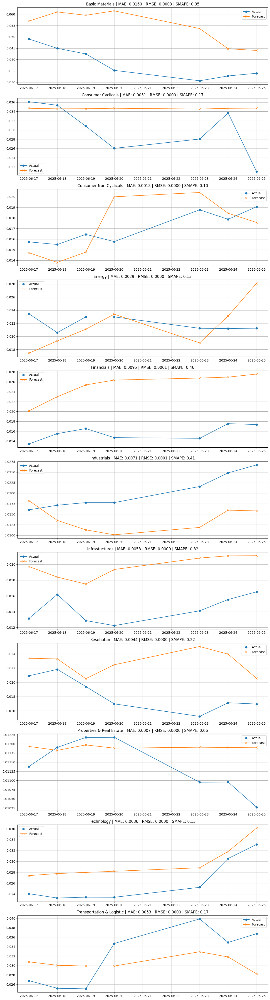


📊 Evaluasi Akhir
                       sector       MAE          RMSE     SMAPE
0             Basic Materials  0.016040  2.962264e-04  0.348882
1          Consumer Cyclicals  0.005125  4.621938e-05  0.170439
2      Consumer Non-Cyclicals  0.001757  4.249723e-06  0.103090
3                      Energy  0.002940  1.388900e-05  0.133760
4                  Financials  0.009497  9.374778e-05  0.463521
5                 Industrials  0.007070  5.878656e-05  0.413156
6              Infrastuctures  0.005344  3.106822e-05  0.316605
7                   Kesehatan  0.004398  2.795089e-05  0.217605
8    Properties & Real Estate  0.000666  7.008673e-07  0.058391
9                  Technology  0.003569  1.400569e-05  0.132412
10  Transportation & Logistic  0.005274  3.071533e-05  0.168677


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
from neuralforecast.models import TFT
from neuralforecast.core import NeuralForecast
from neuralforecast.losses.numpy import smape

# =============================
# CONFIGURASI
# =============================
SAVE_DIR = './autotuned_models_decoupled'
INPUT_PATH = '/content/sector_vol_with_geo_2_7d.csv'
HORIZON = 7

# Daftar sektor yang ingin dicek
settings = [
    {"sector": "Basic Materials", "feature": "GPR_Threat_Daily", "model": "AutoNHITS"},
    {"sector": "Consumer Cyclicals", "feature": "ArticlesCount_Daily", "model": "AutoNBEATSx"},
    {"sector": "Consumer Non-Cyclicals", "feature": "GPR_Threat_Daily", "model": "AutoTFT"},
    {"sector": "Energy", "feature": "GPR_Threat_Daily", "model": "AutoLSTM"},
    {"sector": "Financials", "feature": "GPR_Threat_Daily", "model": "AutoTFT"},
    {"sector": "Industrials", "feature": "ArticlesCount_Daily", "model": "AutoNBEATSx"},
    {"sector": "Infrastuctures", "feature": "GPR_Daily", "model": "AutoTFT"},
    {"sector": "Kesehatan", "feature": None, "model": "AutoLSTM"},  # Univariate (tanpa berita)
    {"sector": "Properties & Real Estate", "feature": "GPR_Threat_Daily", "model": "AutoNHITS"},
    {"sector": "Technology", "feature": "GPR_Action_Daily", "model": "AutoTFT"},
    {"sector": "Transportation & Logistic", "feature": "GPR_Action_Daily", "model": "AutoLSTM"},
]

# Load data
df = pd.read_csv(INPUT_PATH, parse_dates=['Date'])

# Setup plotting
fig, axes = plt.subplots(len(settings), 1, figsize=(12, 4 * len(settings)))
if len(settings) == 1:
    axes = [axes]

eval_results = []

for idx, setting in enumerate(settings):
    sector = setting["sector"]
    feature = setting["feature"]
    model_type = setting["model"]

    print(f"\n🔍 Evaluasi model untuk sektor: {sector}")

    # Siapkan data
    df_sector = df[df["Sector"] == sector].copy()
    if feature:
        df_sector = df_sector.rename(columns={
            "Date": "ds",
            "SectorVolatility_7d": "y",
            feature: "x"
        })
        df_sector["unique_id"] = sector
        df_sector = df_sector[["unique_id", "ds", "y", "x"]]
    else:
        df_sector = df_sector.rename(columns={
            "Date": "ds",
            "SectorVolatility_7d": "y"
        })
        df_sector["unique_id"] = sector
        df_sector = df_sector[["unique_id", "ds", "y"]]

    # Data untuk evaluasi
    test_df = df_sector[-HORIZON:].reset_index(drop=True)
    actual_y = test_df["y"].values

    # Load model yang sudah disimpan
    model_dir = os.path.join(SAVE_DIR, sector.replace(" & ", "_and_").replace(" ", "_"))
    nf = NeuralForecast.load(path=model_dir)

    # Prediksi
    preds = nf.predict()
    pred_y = preds[model_type].tail(HORIZON).values

    # Hitung metrik evaluasi
    mae = mean_absolute_error(actual_y, pred_y)
    rmse = mean_squared_error(actual_y, pred_y)
    smape_val = smape(actual_y, pred_y)

    eval_results.append({
        "sector": sector,
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE": smape_val
    })

    # Plot prediksi vs aktual
    ax = axes[idx]
    ax.plot(test_df["ds"], actual_y, label="Actual", marker='o')
    ax.plot(test_df["ds"], pred_y, label="Forecast", marker='x')
    ax.set_title(f"{sector} | MAE: {mae:.4f} | RMSE: {rmse:.4f} | SMAPE: {smape_val:.2f}")
    ax.legend()
    ax.grid(True)

# Tampilkan seluruh plot
plt.tight_layout()
plt.show()

# Tampilkan hasil evaluasi sebagai DataFrame
results_df = pd.DataFrame(eval_results)
print("\n📊 Evaluasi Akhir")
print(results_df)


In [ ]:
results_df.to_csv("Evaluasi_tuning.csv", index=False)

In [ ]:
df_base_model = pd.read_csv("/content/best_model_and_features_per_sector_new.csv")
df_base_model

,Skenario,Sektor,Jml_Fitur,MAE,RMSE,SMAPE,Model
0,Multivariate (GPR_Threat_Daily),Basic Materials,2,0.004126,0.005645,10.251583,NHITS
1,Multivariate (Article Count),Consumer Cyclicals,2,0.003390,0.004470,12.397692,NBEATS
2,Multivariate (GPR_Threat_Daily),Consumer Non-Cyclicals,2,0.001025,0.001141,6.195765,TFT
3,Multivariate (GPR_Threat_Daily),Energy,2,0.002862,0.003650,12.307295,LSTM
4,Multivariate (GPR_Threat_Daily),Financials,2,0.001295,0.001555,8.394873,TFT
5,Multivariate (Article Count),Industrials,2,0.002905,0.003472,17.029961,NBEATS
6,Multivariate (GPR_Daily),Infrastuctures,2,0.002499,0.003082,14.331518,TFT
7,Univariate (Tanpa Berita),Kesehatan,1,0.002449,0.002972,11.910092,LSTM
8,Multivariate (GPR_Threat_Daily),Properties & Real Estate,2,0.001103,0.001336,10.417634,NHITS
9,Multivariate (GPR_Action_Daily),Technology,2,0.003227,0.004589,12.658724,TFT


# ***Perbandingan Tanpa Tune vs Tune***
---

In [ ]:
# download evaluasi Biasa
!gdown --fuzzy https://drive.google.com/file/d/1xPsvK6eNr8kOgqvxF-i5VMWgoWu6ZZN5/view?usp=drive_link

# downlaod evaluasi Tuning
!gdown --fuzzy https://drive.google.com/file/d/1AYeBT-9EEmau0MiKzTexxVrnZzIqhLJi/view?usp=drive_link

Downloading...
From: https://drive.google.com/uc?id=1xPsvK6eNr8kOgqvxF-i5VMWgoWu6ZZN5
To: /content/best_model_and_features_per_sector_new.csv
100% 1.25k/1.25k [00:00<00:00, 9.29MB/s]
Downloading...
From: https://drive.google.com/uc?id=1AYeBT-9EEmau0MiKzTexxVrnZzIqhLJi
To: /content/Evaluasi_tuning.csv
100% 889/889 [00:00<00:00, 5.99MB/s]


In [ ]:
import pandas as pd

df_base_model = pd.read_csv("/content/best_model_and_features_per_sector_new.csv")
results_df = pd.read_csv("/content/Evaluasi_tuning.csv")

results_df['SMAPE'] = results_df['SMAPE'] * 100
results_df

,sector,MAE,RMSE,SMAPE
0,Basic Materials,0.016040,2.962264e-04,34.888241
1,Consumer Cyclicals,0.005125,4.621938e-05,17.043876
2,Consumer Non-Cyclicals,0.001757,4.249723e-06,10.308986
3,Energy,0.002940,1.388900e-05,13.376027
4,Financials,0.009497,9.374778e-05,46.352132
5,Industrials,0.007070,5.878656e-05,41.315621
6,Infrastuctures,0.005344,3.106822e-05,31.660543
7,Kesehatan,0.004398,2.795089e-05,21.760496
8,Properties & Real Estate,0.000666,7.008673e-07,5.839080
9,Technology,0.003569,1.400569e-05,13.241230


In [ ]:
print("Perbandingan SMAPE Sebelum dan Setelah Tuning:")

# Gabungkan kedua dataframe berdasarkan sektor
comparison_df = pd.merge(
    df_base_model[['Sektor', 'SMAPE']],
    results_df[['sector', 'SMAPE']],
    left_on='Sektor',
    right_on='sector',
    suffixes=('_BeforeTuning', '_AfterTuning')
).drop(columns=['sector'])

# Tentukan mana yang lebih rendah
comparison_df['SMAPE_Comparison'] = comparison_df.apply(
    lambda row: 'After Tuning is Better' if row['SMAPE_AfterTuning'] < row['SMAPE_BeforeTuning']
                else ('Before Tuning is Better' if row['SMAPE_BeforeTuning'] < row['SMAPE_AfterTuning']
                      else 'Equal'),
    axis=1
)

# Tampilkan hasilnya
comparison_df


Perbandingan SMAPE Sebelum dan Setelah Tuning:


,Sektor,SMAPE_BeforeTuning,SMAPE_AfterTuning,SMAPE_Comparison
0,Basic Materials,10.251583,34.888241,Before Tuning is Better
1,Consumer Cyclicals,12.397692,17.043876,Before Tuning is Better
2,Consumer Non-Cyclicals,6.195765,10.308986,Before Tuning is Better
3,Energy,12.307295,13.376027,Before Tuning is Better
4,Financials,8.394873,46.352132,Before Tuning is Better
5,Industrials,17.029961,41.315621,Before Tuning is Better
6,Infrastuctures,14.331518,31.660543,Before Tuning is Better
7,Kesehatan,11.910092,21.760496,Before Tuning is Better
8,Properties & Real Estate,10.417634,5.839080,After Tuning is Better
9,Technology,12.658724,13.241230,Before Tuning is Better


In [ ]:
results_df.to_csv("Evaluasi_model_akhir_3cv", index=False)

# ***Evaluasi & Simpan Best Model***
---

INFO:lightning_fabric.utilities.seed:Seed set to 1



🔬 MEMPROSES: Basic Materials | MODEL: NHITS
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0064 | RMSE=0.0079 | sMAPE=15.47%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Basic Materials disimpan di ./final_models/Basic_Materials

🔬 MEMPROSES: Consumer Cyclicals | MODEL: NBEATSx
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0073 | RMSE=0.0084 | sMAPE=25.77%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Consumer Cyclicals disimpan di ./final_models/Consumer_Cyclicals

🔬 MEMPROSES: Consumer Non-Cyclicals | MODEL: TFT
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0072 | RMSE=0.0076 | sMAPE=35.23%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Consumer Non-Cyclicals disimpan di ./final_models/Consumer_Non-Cyclicals

🔬 MEMPROSES: Energy | MODEL: LSTM
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0022 | RMSE=0.0028 | sMAPE=9.36%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Energy disimpan di ./final_models/Energy

🔬 MEMPROSES: Financials | MODEL: TFT
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0040 | RMSE=0.0045 | sMAPE=31.30%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Financials disimpan di ./final_models/Financials

🔬 MEMPROSES: Industrials | MODEL: NBEATSx
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0018 | RMSE=0.0023 | sMAPE=10.38%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Industrials disimpan di ./final_models/Industrials

🔬 MEMPROSES: Infrastuctures | MODEL: TFT
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0031 | RMSE=0.0041 | sMAPE=19.84%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Infrastuctures disimpan di ./final_models/Infrastuctures

🔬 MEMPROSES: Kesehatan | MODEL: LSTM
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0025 | RMSE=0.0031 | sMAPE=12.65%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Kesehatan disimpan di ./final_models/Kesehatan

🔬 MEMPROSES: Properties & Real Estate | MODEL: NHITS
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0014 | RMSE=0.0016 | sMAPE=11.28%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Properties & Real Estate disimpan di ./final_models/Properties_and_Real_Estate

🔬 MEMPROSES: Technology | MODEL: TFT
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0048 | RMSE=0.0061 | sMAPE=21.22%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✔️ Model untuk Technology disimpan di ./final_models/Technology

🔬 MEMPROSES: Transportation & Logistic | MODEL: LSTM
  📊 Mengevaluasi model dengan 5 windows CV...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Hasil CV Keseluruhan: MAE=0.0042 | RMSE=0.0057 | sMAPE=14.12%
  🚂 Melatih model final pada seluruh data...


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

  ✔️ Model untuk Transportation & Logistic disimpan di ./final_models/Transportation_and_Logistic


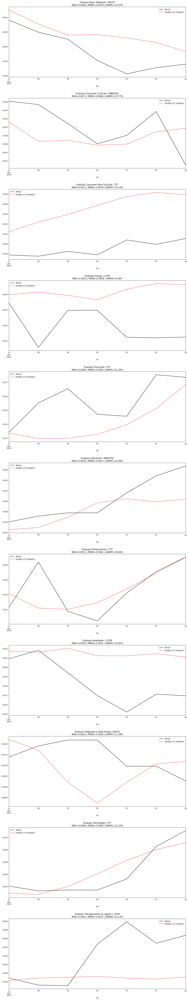



==================== RINGKASAN EVALUASI MODEL ====================


,,MAE,RMSE,sMAPE (%)
Sektor,Model,,,
Basic Materials,NHITS,0.0064,0.0079,15.47%
Consumer Cyclicals,NBEATSx,0.0073,0.0084,25.77%
Consumer Non-Cyclicals,TFT,0.0072,0.0076,35.23%
Energy,LSTM,0.0022,0.0028,9.36%
Financials,TFT,0.0040,0.0045,31.30%
Industrials,NBEATSx,0.0018,0.0023,10.38%
Infrastuctures,TFT,0.0031,0.0041,19.84%
Kesehatan,LSTM,0.0025,0.0031,12.65%
Properties & Real Estate,NHITS,0.0014,0.0016,11.28%


In [ ]:
# ==============================================================================
# SKRIP FINAL v4: sMAPE, EVALUASI, TRAINING, PENYIMPANAN, & TABEL HASIL
# ==============================================================================
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from IPython.display import display # Untuk menampilkan tabel yang rapi
from neuralforecast.core import NeuralForecast
from neuralforecast.models import TFT, NHITS, NBEATSx, LSTM
from neuralforecast.losses.pytorch import MAE
from sklearn.metrics import mean_absolute_error, mean_squared_error
import logging

logging.getLogger("pytorch_lightning").setLevel(logging.WARNING)

# 💡 1. Tambahkan fungsi untuk sMAPE
def smape(y_true, y_pred):
    """Symmetric Mean Absolute Percentage Error"""
    epsilon = 1e-10 # Hindari pembagian dengan nol
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2 + epsilon
    return np.mean(numerator / denominator) * 100

# --- Konfigurasi Umum ---
INPUT_PATH = '/content/sector_vol_with_geo_2_7d.csv'
SAVE_DIR = './final_models'
HORIZON = 7
N_CV_WINDOWS = 5
os.makedirs(SAVE_DIR, exist_ok=True)
df = pd.read_csv(INPUT_PATH, parse_dates=['Date'])

# --- Konfigurasi Model Dasar ---
BASE_CONFIG = {
    "input_size": 30, "max_steps": 500, "batch_size": 16,
    "early_stop_patience_steps": 5, "n_blocks": [1, 1, 1],
    "hidden_size": 64, "num_layers": 2, "scaler_type": 'minmax'
}

# --- Pengaturan Model per Sektor ---
settings = [
    {"sector": "Basic Materials", "feature": "GPR_Threat_Daily", "model": "NHITS"},
    {"sector": "Consumer Cyclicals", "feature": "ArticlesCount_Daily", "model": "NBEATSx"},
    {"sector": "Consumer Non-Cyclicals", "feature": "GPR_Threat_Daily", "model": "TFT"},
    {"sector": "Energy", "feature": "GPR_Threat_Daily", "model": "LSTM"},
    {"sector": "Financials", "feature": "GPR_Threat_Daily", "model": "TFT"},
    {"sector": "Industrials", "feature": "ArticlesCount_Daily", "model": "NBEATSx"},
    {"sector": "Infrastuctures", "feature": "GPR_Daily", "model": "TFT"},
    {"sector": "Kesehatan", "feature": None, "model": "LSTM"},
    {"sector": "Properties & Real Estate", "feature": "GPR_Threat_Daily", "model": "NHITS"},
    {"sector": "Technology", "feature": "GPR_Action_Daily", "model": "TFT"},
    {"sector": "Transportation & Logistic", "feature": "GPR_Action_Daily", "model": "LSTM"},
]

# --- Persiapan untuk Hasil dan Plot ---
cv_results = []
fig, axes = plt.subplots(len(settings), 1, figsize=(15, 7 * len(settings)))
if len(settings) == 1:
    axes = [axes]

# ======================= LOOP UTAMA =======================
for idx, setting in enumerate(settings):
    sector, feature, model_type = setting['sector'], setting['feature'], setting['model']
    print(f"\n{'='*50}\n🔬 MEMPROSES: {sector} | MODEL: {model_type}\n{'='*50}")

    # 1. Persiapan Data (Tidak berubah)
    df_sector = df[df['Sector'] == sector].copy()
    if feature:
        df_sector[feature] = df_sector[feature].rolling(window=7, min_periods=1).sum()
        df_sector = df_sector.rename(columns={'Date': 'ds', 'SectorVolatility_7d': 'y', feature: 'x'})
        df_sector['unique_id'] = sector
        df_sector = df_sector[['unique_id', 'ds', 'y', 'x']]
    else:
        df_sector = df_sector.rename(columns={'Date': 'ds', 'SectorVolatility_7d': 'y'})
        df_sector['unique_id'] = sector
        df_sector = df_sector[['unique_id', 'ds', 'y']]

    # 2. Inisialisasi Model Dasar (Tidak berubah)
    common_params = {
        'h': HORIZON, 'input_size': BASE_CONFIG['input_size'], 'loss': MAE(),
        'max_steps': BASE_CONFIG['max_steps'], 'batch_size': BASE_CONFIG['batch_size'],
        'random_seed': 1
    }
    if feature:
        common_params['hist_exog_list'] = ['x']
    cv_params = common_params.copy()
    cv_params['early_stop_patience_steps'] = BASE_CONFIG['early_stop_patience_steps']
    if model_type == "TFT":
        model_for_cv = TFT(**cv_params, scaler_type=BASE_CONFIG['scaler_type'])
    elif model_type == "NHITS":
        model_for_cv = NHITS(**cv_params, n_blocks=BASE_CONFIG['n_blocks'], scaler_type=BASE_CONFIG['scaler_type'])
    elif model_type == "NBEATSx":
        model_for_cv = NBEATSx(**cv_params, n_blocks=BASE_CONFIG['n_blocks'], scaler_type=BASE_CONFIG['scaler_type'])
    elif model_type == "LSTM":
        model_for_cv = LSTM(**cv_params, scaler_type=BASE_CONFIG['scaler_type'])

    # 3. Evaluasi dengan Cross-Validation
    nf_cv = NeuralForecast(models=[model_for_cv], freq='D')
    print(f"  📊 Mengevaluasi model dengan {N_CV_WINDOWS} windows CV...")
    cv_df = nf_cv.cross_validation(df=df_sector, n_windows=N_CV_WINDOWS, val_size=HORIZON)

    if not cv_df.empty:
        cv_df.dropna(inplace=True)
        # Hitung metrik dari keseluruhan hasil CV
        mae = mean_absolute_error(cv_df['y'], cv_df[model_type])
        rmse = np.sqrt(mean_squared_error(cv_df['y'], cv_df[model_type]))
        # 💡 2. Hitung sMAPE
        smape_val = smape(cv_df['y'].values, cv_df[model_type].values)

        cv_results.append({'Sektor': sector, 'Model': model_type, 'MAE': mae, 'RMSE': rmse, 'sMAPE (%)': smape_val})
        print(f"  ✅ Hasil CV Keseluruhan: MAE={mae:.4f} | RMSE={rmse:.4f} | sMAPE={smape_val:.2f}%")

        # Filter window terakhir untuk visualisasi
        last_cutoff = cv_df['cutoff'].max()
        last_window_df = cv_df[cv_df['cutoff'] == last_cutoff].copy()

        # Visualisasi
        ax = axes[idx]
        last_window_df.plot(x='ds', y='y', ax=ax, label='Aktual', style='-', color='black')
        last_window_df.plot(x='ds', y=model_type, ax=ax, label='Prediksi (CV Terakhir)', style='--', color='red')
        ax.set_title(f"Evaluasi {sector} | {model_type}\nMAE={mae:.4f} | RMSE={rmse:.4f} | sMAPE={smape_val:.2f}%")
        ax.legend()
    else:
        axes[idx].set_title(f"{sector} ({model_type}) - Gagal CV")

    # 4. Training Final & Penyimpanan Model (Tidak berubah)
    print(f"  🚂 Melatih model final pada seluruh data...")
    if model_type == "TFT":
        final_model = TFT(**common_params, scaler_type=BASE_CONFIG['scaler_type'])
    elif model_type == "NHITS":
        final_model = NHITS(**common_params, n_blocks=BASE_CONFIG['n_blocks'], scaler_type=BASE_CONFIG['scaler_type'])
    elif model_type == "NBEATSx":
        final_model = NBEATSx(**common_params, n_blocks=BASE_CONFIG['n_blocks'], scaler_type=BASE_CONFIG['scaler_type'])
    elif model_type == "LSTM":
        final_model = LSTM(**common_params, scaler_type=BASE_CONFIG['scaler_type'])

    nf_final = NeuralForecast(models=[final_model], freq='D')
    nf_final.fit(df=df_sector)
    model_path = os.path.join(SAVE_DIR, sector.replace(" & ", "_and_").replace(" ", "_"))
    nf_final.save(path=model_path, overwrite=True)
    print(f"  ✔️ Model untuk {sector} disimpan di {model_path}")

# ======================= HASIL AKHIR =======================
plt.tight_layout(pad=3.0)
plt.show()

# 💡 3. Buat dan tampilkan DataFrame hasil yang rapi
print("\n\n==================== RINGKASAN EVALUASI MODEL ====================")
if cv_results:
    results_df = pd.DataFrame(cv_results)

    # Fungsi untuk menandai nilai terendah (terbaik) di setiap kolom metrik
    def highlight_min(s):
        is_min = s == s.min()
        return ['background-color: #d4edda' if v else '' for v in is_min]

    # Atur 'Sektor' dan 'Model' sebagai index untuk tampilan yang lebih baik
    results_df.set_index(['Sektor', 'Model'], inplace=True)

    # Terapkan styling
    styled_df = results_df.style.format({
        'MAE': '{:.4f}',
        'RMSE': '{:.4f}',
        'sMAPE (%)': '{:.2f}%'
    }).apply(highlight_min, subset=['MAE', 'RMSE', 'sMAPE (%)']).set_caption(
        "Perbandingan Kinerja Model (Nilai Terendah = Terbaik)"
    ).set_table_styles([{
        'selector': 'caption',
        'props': [('font-size', '16px'), ('font-weight', 'bold'), ('text-align', 'center')]
    }])

    display(styled_df)
else:
    print("Tidak ada hasil evaluasi untuk ditampilkan.")

In [ ]:
results_df.to_csv("EVALUASI_FINAL_MODEL.csv", index=False)

In [ ]:
# prompt: ZIP /content/final_models dan download
from google.colab import files
import shutil

!zip -r /content/final_models.zip /content/final_models
files.download('/content/final_models.zip')


updating: content/final_models/ (stored 0%)
updating: content/final_models/Basic_Materials/ (stored 0%)
updating: content/final_models/Basic_Materials/dataset.pkl (deflated 40%)
updating: content/final_models/Basic_Materials/NHITS_0.ckpt (deflated 7%)
updating: content/final_models/Basic_Materials/configuration.pkl (deflated 33%)
updating: content/final_models/Basic_Materials/alias_to_model.pkl (deflated 13%)
updating: content/final_models/Infrastuctures/ (stored 0%)
updating: content/final_models/Infrastuctures/TFT_0.ckpt (deflated 9%)
updating: content/final_models/Infrastuctures/dataset.pkl (deflated 40%)
updating: content/final_models/Infrastuctures/configuration.pkl (deflated 33%)
updating: content/final_models/Infrastuctures/alias_to_model.pkl (deflated 15%)
updating: content/final_models/Energy/ (stored 0%)
updating: content/final_models/Energy/dataset.pkl (deflated 43%)
updating: content/final_models/Energy/configuration.pkl (deflated 33%)
updating: content/final_models/Energy/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# ***Testing Predictions***
---

In [ ]:
# download folder final model
!gdown --folder https://drive.google.com/drive/folders/1oSRIBpGuzLW-pgHD69OzLyTFM4OBrg66?usp=drive_link

# download data volatilitas sektor + geopolitic 2
!gdown 1P2LXh8gwsfggiA1TTzGU9mdYYhV3hEMB

Retrieving folder contents
Retrieving folder 1AKrltlbOBGtpvLnycqClg8Sro4P7D7m7 final_models
Retrieving folder 1yFJhpmA_bfsMH5NT3YkImw08BVCGhgM2 Transportation_and_Logistic
Processing file 1ams6EkZSFHaloEVyrHuFBYqpkQs5QZES configuration.pkl
Processing file 1D8vw5cIHzU2YiMzVgYyIwB-jWkfTKc9y LSTM_0.ckpt
Processing file 15cRri-P743Pq3O1jd_YNB3PVoiL-Naid alias_to_model.pkl
Processing file 1GPwyIXdG-ruxPuNYNokkuXts_74EABZa dataset.pkl
Retrieving folder 1F62n7y9iHLjFaTz0B1twZFGl6vHWUA_k Infrastuctures
Processing file 11LesYrDuWjsj4LW0PmfKvNvdHw37d7-4 configuration.pkl
Processing file 1ImnoxtfY5tlIx9NHONfdtG-C5H1-T4Qx TFT_0.ckpt
Processing file 1jSabCzAn7jywku4qatpB95sg6gr3F-rR dataset.pkl
Processing file 1etyBKK_NlqM36gXtbm0RadBCAOqblwS9 alias_to_model.pkl
Retrieving folder 1W4NB1WrAtyz-qbPWyS8JXm5f_Nw8VzAo Financials
Processing file 1txuJuSZkVP30sDdUStcPgMfS9X6_A2jk TFT_0.ckpt
Processing file 1zcvNjKRVtvAGeSqA1iq4T1OKhH4RKbQk dataset.pkl
Processing file 1N2IEDzuDclBuHhtM4F9KncZ-yqMyn8E2 alia

In [ ]:
import pandas as pd
import numpy as np
import os
from neuralforecast.core import NeuralForecast
from IPython.display import display
import logging

logging.getLogger("pytorch_lightning").setLevel(logging.WARNING)

def generate_all_predictions(data_path: str, model_save_dir: str, horizon: int):
    """
    Memuat semua model terlatih, membuat prediksi untuk setiap sektor,
    dan mengembalikan hasilnya dalam satu DataFrame.

    Args:
        data_path (str): Path ke file CSV data lengkap.
        model_save_dir (str): Path ke direktori utama tempat semua model disimpan.
        horizon (int): Jumlah hari ke depan yang akan diprediksi.

    Returns:
        pd.DataFrame: Sebuah DataFrame tunggal berisi semua prediksi, atau None jika gagal.
    """

    # --- MODEL SETTINGS ---
    settings = [
        {"sector": "Basic Materials", "feature": "GPR_Threat_Daily", "model": "NHITS"},
        {"sector": "Consumer Cyclicals", "feature": "ArticlesCount_Daily", "model": "NBEATSx"},
        {"sector": "Consumer Non-Cyclicals", "feature": "GPR_Threat_Daily", "model": "TFT"},
        {"sector": "Energy", "feature": "GPR_Threat_Daily", "model": "LSTM"},
        {"sector": "Financials", "feature": "GPR_Threat_Daily", "model": "TFT"},
        {"sector": "Industrials", "feature": "ArticlesCount_Daily", "model": "NBEATSx"},
        {"sector": "Infrastuctures", "feature": "GPR_Daily", "model": "TFT"},
        {"sector": "Kesehatan", "feature": None, "model": "LSTM"},
        {"sector": "Properties & Real Estate", "feature": "GPR_Threat_Daily", "model": "NHITS"},
        {"sector": "Technology", "feature": "GPR_Action_Daily", "model": "TFT"},
        {"sector": "Transportation & Logistic", "feature": "GPR_Action_Daily", "model": "LSTM"},
    ]

    try:
        df = pd.read_csv(data_path, parse_dates=['Date'])
    except FileNotFoundError:
        print(f"❌ ERROR: File data di '{data_path}' tidak ditemukan.")
        return None

    all_predictions_list = []
    print("Memulai pipeline prediksi untuk semua sektor...")

    for setting in settings:
        sector = setting['sector']
        model_type = setting['model']
        feature = setting['feature']

        model_path = os.path.join(model_save_dir, sector.replace(" & ", "_and_").replace(" ", "_"))
        print(f"\n-- Memproses {sector}... --")

        try:
            nf_loaded = NeuralForecast.load(path=model_path)
            historical_df = df[df['Sector'] == sector].copy()

            if feature:
                historical_df[feature] = historical_df[feature].rolling(window=7, min_periods=1).sum()
                historical_df.fillna(0, inplace=True)
                historical_df = historical_df.rename(columns={feature: 'x'})

            historical_df = historical_df.rename(columns={'Date': 'ds', 'Sector': 'unique_id'})
            predictions = nf_loaded.predict()

            predictions_renamed = predictions.rename(columns={
                'ds': 'Date',
                model_type: 'SectorVolatility_7d'
            })
            predictions_renamed['Sector'] = sector
            all_predictions_list.append(predictions_renamed[['Date', 'Sector', 'SectorVolatility_7d']])
            print(f"  ✅ Prediksi untuk {sector} selesai.")
        except FileNotFoundError:
            print(f"  ⚠️ Peringatan: Model untuk '{sector}' tidak ditemukan. Melewati...")
            continue

    if not all_predictions_list:
        print("\nTidak ada prediksi yang berhasil dibuat.")
        return None

    final_predictions_df = pd.concat(all_predictions_list, ignore_index=True)
    return final_predictions_df

In [ ]:
# ==============================================================================
# CONTOH PEMANGGILAN FUNGSI
# ==============================================================================

# --- Konfigurasi yang dibutuhkan oleh fungsi ---
SAVE_DIR_PATH = '/content/Final Model/final_models'
INPUT_DATA_PATH = '/content/sector_vol_with_geo_2_7d.csv'
FORECAST_HORIZON = 7

# --- Panggil fungsi untuk mendapatkan semua prediksi ---
# Perhatikan, Anda tidak perlu lagi memberikan 'settings'
all_forecasts_df = generate_all_predictions(
    data_path=INPUT_DATA_PATH,
    model_save_dir=SAVE_DIR_PATH,
    horizon=FORECAST_HORIZON
)

# --- Tampilkan hasil akhir ---
if all_forecasts_df is not None:
    print("\n\n==================== HASIL AKHIR PREDIKSI GABUNGAN ====================")
    display(all_forecasts_df)

INFO:lightning_fabric.utilities.seed:Seed set to 1


Memulai pipeline prediksi untuk semua sektor...

-- Memproses Basic Materials... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Basic Materials selesai.

-- Memproses Consumer Cyclicals... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Consumer Cyclicals selesai.

-- Memproses Consumer Non-Cyclicals... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Consumer Non-Cyclicals selesai.

-- Memproses Energy... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Energy selesai.

-- Memproses Financials... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Financials selesai.

-- Memproses Industrials... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Industrials selesai.

-- Memproses Infrastuctures... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Infrastuctures selesai.

-- Memproses Kesehatan... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Kesehatan selesai.

-- Memproses Properties & Real Estate... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Properties & Real Estate selesai.

-- Memproses Technology... --


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:lightning_fabric.utilities.seed:Seed set to 1


  ✅ Prediksi untuk Technology selesai.

-- Memproses Transportation & Logistic... --


Predicting: |          | 0/? [00:00<?, ?it/s]

  ✅ Prediksi untuk Transportation & Logistic selesai.


==================== HASIL AKHIR PREDIKSI GABUNGAN ====================


,Date,Sector,SectorVolatility_7d
0,2025-06-26,Basic Materials,0.032111
1,2025-06-27,Basic Materials,0.034524
2,2025-06-28,Basic Materials,0.030356
3,2025-06-29,Basic Materials,0.028076
4,2025-06-30,Basic Materials,0.028993
...,...,...,...
72,2025-06-28,Transportation & Logistic,0.027834
73,2025-06-29,Transportation & Logistic,0.029173
74,2025-06-30,Transportation & Logistic,0.030702
75,2025-07-01,Transportation & Logistic,0.029921


In [ ]:
# simpan hasil prediksi untuk di append pada df untuk DRL
all_forecasts_df.to_csv("hasil_prediksi_df_25_juni_7d")

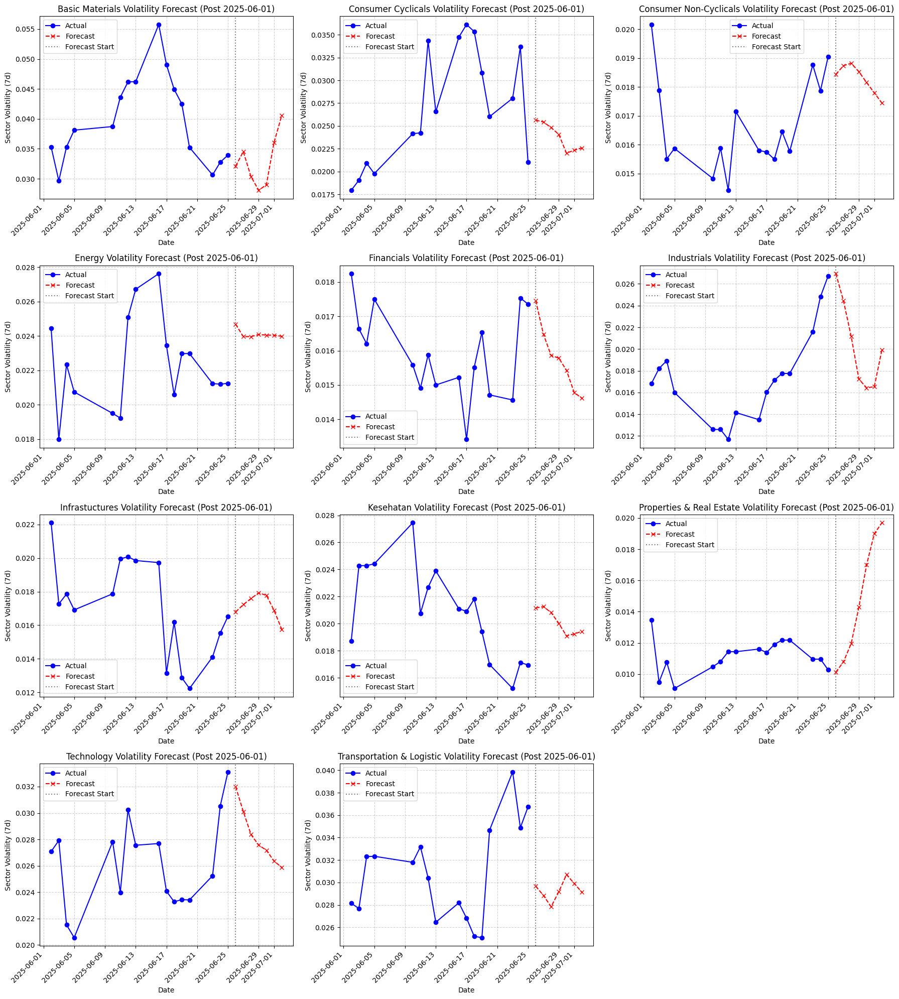

In [ ]:
# @title Plot Hasil Prediksi Volatilitas pada Dataset
# Pastikan semua library yang dibutuhkan sudah diimpor seperti di kode sebelumnya
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

df = pd.read_csv('/content/sector_vol_with_geo_2_7d.csv', parse_dates=['Date'])

# Filter df untuk tanggal setelah 2025-06-01
df_filtered = df[df['Date'] > '2025-06-01'].copy()

# Ambil daftar sektor unik dari hasil prediksi (atau dari df_filtered jika perlu)
# Menggunakan sektor dari all_forecasts_df lebih akurat karena hanya sektor ini yang diprediksi
sectors_to_plot = all_forecasts_df['Sector'].unique()

# Tentukan jumlah subplot
n_sectors = len(sectors_to_plot)
n_cols = 3  # Misalnya, 3 kolom per baris
n_rows = (n_sectors + n_cols - 1) // n_cols # Hitung jumlah baris yang dibutuhkan

# Buat figure dan axes untuk subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 5), squeeze=False)
axes = axes.flatten() # Ratakan array 2D axes menjadi 1D untuk kemudahan indexing

# Loop melalui setiap sektor untuk plotting
for i, sector in enumerate(sectors_to_plot):
    ax = axes[i] # Pilih subplot untuk sektor saat ini

    # Filter data aktual untuk sektor dan tanggal yang relevan
    actual_data = df_filtered[df_filtered['Sector'] == sector].copy()

    # Filter data prediksi untuk sektor yang sama
    predictions_data = all_forecasts_df[all_forecasts_df['Sector'] == sector].copy()

    # Gabungkan data aktual dan prediksi untuk plotting
    # Ini akan menggabungkan data aktual sampai tanggal terakhir di df_filtered
    # dan menambahkan data prediksi setelah tanggal tersebut
    # Pastikan kolom ds dan y ada
    combined_data = pd.concat([
        actual_data[['Date', 'SectorVolatility_7d']].rename(columns={'Date': 'ds', 'SectorVolatility_7d': 'y'}),
        predictions_data[['Date', 'SectorVolatility_7d']].rename(columns={'Date': 'ds', 'SectorVolatility_7d': 'y'})
    ]).sort_values('ds').reset_index(drop=True)

    # Tandai titik awal prediksi untuk garis vertikal
    prediction_start_date = predictions_data['Date'].min()

    # Plot data aktual
    ax.plot(actual_data['Date'], actual_data['SectorVolatility_7d'], label='Actual', marker='o', linestyle='-', color='blue')

    # Plot data prediksi
    ax.plot(predictions_data['Date'], predictions_data['SectorVolatility_7d'], label='Forecast', marker='x', linestyle='--', color='red')

    # Tambahkan garis vertikal di tanggal awal prediksi jika ada data prediksi
    if not predictions_data.empty:
        ax.axvline(prediction_start_date, color='gray', linestyle=':', label='Forecast Start')


    # Tambahkan judul dan label
    ax.set_title(f'{sector} Volatility Forecast (Post 2025-06-01)')
    ax.set_xlabel('Date')
    ax.set_ylabel('Sector Volatility (7d)')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.6)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right") # Rotasi label sumbu x

# Sembunyikan subplot yang tidak digunakan
for j in range(n_sectors, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout() # Sesuaikan layout agar tidak tumpang tindih
plt.show()
